<a href="https://colab.research.google.com/github/Karthikeyan-MJ/Capstone-Project/blob/main/Churn_analysis_work.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Introduction to the Dataset**

● userid - user id.\
● Churn – Whether the user/customer will Churn or not.\
● Age - age of the customer. \
● Housing – Own House or in Rented House. \
● Credit score - Customer's credit score.\
● Deposits- Number of Deposits the customer has done.\
● Withdrawals – Number of withdrawals by the person.\
● Purchases- Number of Purchases done by Customer outside of our partner stores.\
● Purchases partners - Number of Purchases done by Customer with our partner stores.\
● cc taken- Number of Credit Card taken by the customer.\
● cc recommended- Number of Credit Card Recommendations done to the person.\
● cc disliked- Whether a person has disliked the credit card.\
● cc liked- Whether a person has liked the credit card or not.\
● cc application begin- Whether a person has began the application for credit card, doesn’t necessarily mean he/she has finished it.\
● App downloaded- Whether the customer has downloaded the app.\
● Web user- Whether or not the customer has visited our website at least one time.\
● App web user- Whether the customer has used both the app as well as the website.\
● IOS user- Is the customer an IOS user or not.\
● Android user- Is the customer an android user or not.\
● Registered Phones- Whether the customer has 1 registered phone number, if more than 1, then how many registered phones the customer has.\
● Payment Type- How Frequently the customer makes the payment(Monthly, Bi-Weekly ,etc).\
● Cancelled Loan- At any point in past whether the user has cancelled loan or not.\
● Received Loan- At any point in past the user has received loan.\
● Rejected Loan- At any point the user has rejected loan or not.\
● Zodiac Sign- Zodiac Sign of the user.\
● Left for two months or plus- Whether the user has left us for two or more than two months and then came back to us.\
● Left for One Month- Whether the customer/user left us for 1 month and came back to us the next month.\
● Reward Earned- How many rewards the user has earned.\
● Is referred- Whether the person was referred about us by somebody else.


## **Importing Libraries**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# to suppress warnings 
from warnings import filterwarnings 
filterwarnings('ignore') 

# display all columns of the dataframe 
pd.options.display.max_columns = None 
# display all rows of the dataframe 
pd.options.display.max_rows = None 

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler

# Importing Dataset

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/Karthikeyan-MJ/Capstone-Project/main/churn_data.csv')
churn = df.copy()
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Leo,1,0,NaN,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,96,0,0,5,1,1,1,1,0,0,Weekly,0,0,0,0,Leo,0,0,44.0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,285,0,0,9,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,26,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,Capricorn,0,0,33.0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,0,0,0,0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Aries,1,0,1.0,0.03,0


In [4]:
churn['churn'].value_counts()

0    15826
1    11174
Name: churn, dtype: int64

## Exploratory Data Analysis (EDA)

In [5]:
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27000 entries, 0 to 26999
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   user                     27000 non-null  int64  
 1   churn                    27000 non-null  int64  
 2   age                      26996 non-null  float64
 3   housing                  27000 non-null  object 
 4   credit_score             18969 non-null  float64
 5   deposits                 27000 non-null  int64  
 6   withdrawal               27000 non-null  int64  
 7   purchases_partners       27000 non-null  int64  
 8   purchases                27000 non-null  int64  
 9   cc_taken                 27000 non-null  int64  
 10  cc_recommended           27000 non-null  int64  
 11  cc_disliked              27000 non-null  int64  
 12  cc_liked                 27000 non-null  int64  
 13  cc_application_begin     27000 non-null  int64  
 14  app_downloaded        

We can observe that most of our features are numerical in nature.

In [6]:
churn.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
user,27000.0,35422.702519,20321.006678,1.0,17810.5,35749.00,53244.25,69658.0
churn,27000.0,0.413852,0.492532,0.0,0.0,0.00,1.00,1.0
age,26996.0,32.219921,9.964838,17.0,25.0,30.00,37.00,91.0
credit_score,18969.0,542.944225,61.059315,2.0,507.0,542.00,578.00,838.0
deposits,27000.0,3.341556,9.131406,0.0,0.0,0.00,1.00,65.0
withdrawal,27000.0,0.307000,1.055416,0.0,0.0,0.00,0.00,29.0
purchases_partners,27000.0,28.062519,42.219686,0.0,0.0,9.00,43.00,1067.0
purchases,27000.0,3.273481,8.953077,0.0,0.0,0.00,1.00,63.0
cc_taken,27000.0,0.073778,0.437299,0.0,0.0,0.00,0.00,29.0
cc_recommended,27000.0,92.625778,88.869343,0.0,10.0,65.00,164.00,522.0


From the above descriptive statistics table we can observe that most of our customer base are from middle age group from 25 to 37, we can also observe that majority of our customers are Android users.

- Therefore the mean of churn out is  **`41%`**,
- so we can say we have quite a balanced dataset.
- From the above descriptive statistics table we can observe that most of our customer base are from middle age group from 25 to 37

In [7]:
total = df.isnull().sum().sort_values(ascending=False)

percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)

missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

# display dataframe of missing values
missing_data

,Total,Percent
credit_score,8031,0.297444
rewards_earned,3227,0.119519
age,4,0.000148
is_referred,0,0.000000
app_downloaded,0,0.000000
churn,0,0.000000
housing,0,0.000000
deposits,0,0.000000
withdrawal,0,0.000000
purchases_partners,0,0.000000


## Null Value Treatment for Age

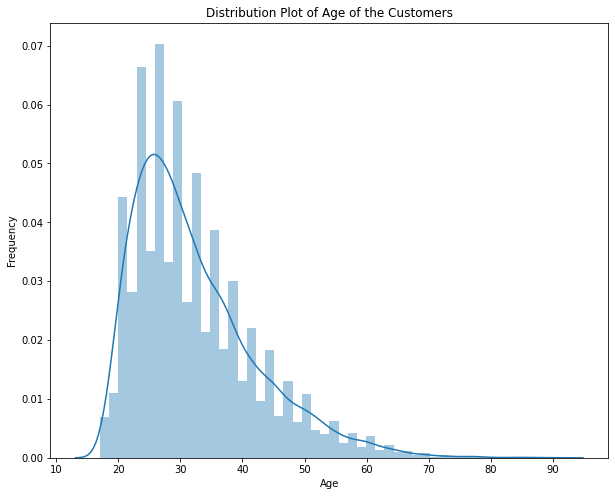

In [8]:
plt.figure(figsize = (10,8))
sns.distplot(churn['age'])
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution Plot of Age of the Customers')
plt.show()

In [9]:
churn['age'] = churn['age'].fillna(churn['age'].mean())

In [10]:
print('Percentage of Null Values in a Feature is :')
print('\n')
print((churn.isnull().sum()/len(churn)) * 100)

Percentage of Null Values in a Feature is :


user                        0.000000
churn                       0.000000
age                         0.000000
housing                     0.000000
credit_score               29.744444
deposits                    0.000000
withdrawal                  0.000000
purchases_partners          0.000000
purchases                   0.000000
cc_taken                    0.000000
cc_recommended              0.000000
cc_disliked                 0.000000
cc_liked                    0.000000
cc_application_begin        0.000000
app_downloaded              0.000000
web_user                    0.000000
app_web_user                0.000000
ios_user                    0.000000
android_user                0.000000
registered_phones           0.000000
payment_type                0.000000
waiting_4_loan              0.000000
cancelled_loan              0.000000
received_loan               0.000000
rejected_loan               0.000000
zodiac_sign                 0

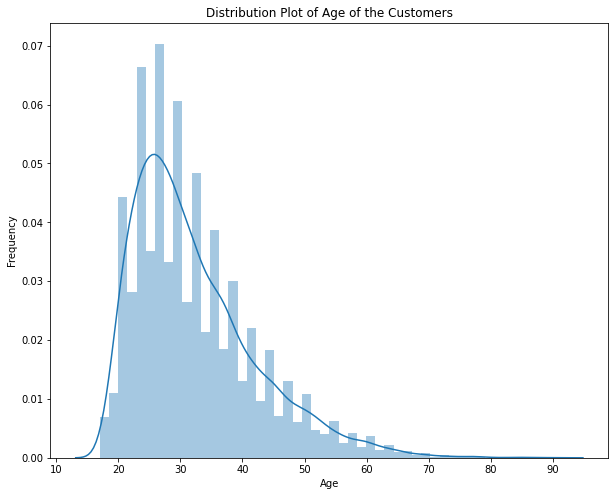

In [11]:
plt.figure(figsize = (10,8))
sns.distplot(churn['age'])
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution Plot of Age of the Customers')
plt.show()

As the Percentage of Null Values in Feature 'Age' was very less, we have imputed these Null values with Mean, we can see there has not been any change in the distribution of age so we can proceed with mean imputation for Age.

## Outlier Treatment for Age

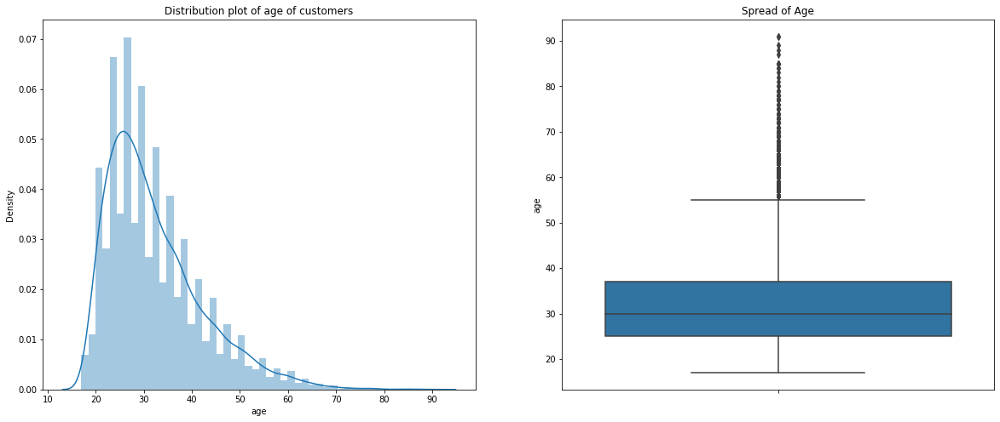

In [12]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn.age)

plt.show()

Looking at the above Chart we can see that too many outliers for age, we shall check for some outlier treatment.

In [13]:
churn['age'].quantile(0.95)

52.0

In [14]:
q3 = churn['age'].quantile(0.75)
q1 = churn['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf

55.0

In [15]:
outliers = churn[churn['age'] > uf]

In [16]:
print('Percentage of Customers who are Outliers are :')
print((len(outliers)/len(churn))*100)

Percentage of Customers who are Outliers are :
3.1037037037037036


In [17]:
churn1 = churn.copy()

In [18]:
uc = churn1['age'].quantile(0.99)

for i in churn1.index:
    if churn1.loc[i,'age'] > uf:
        churn1.loc[i,'age'] = uc

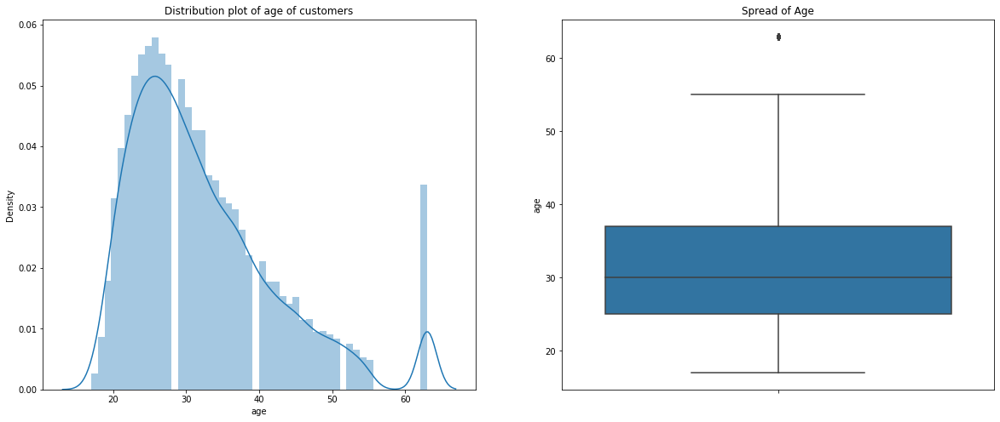

In [19]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn1.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn1.age)

plt.show()

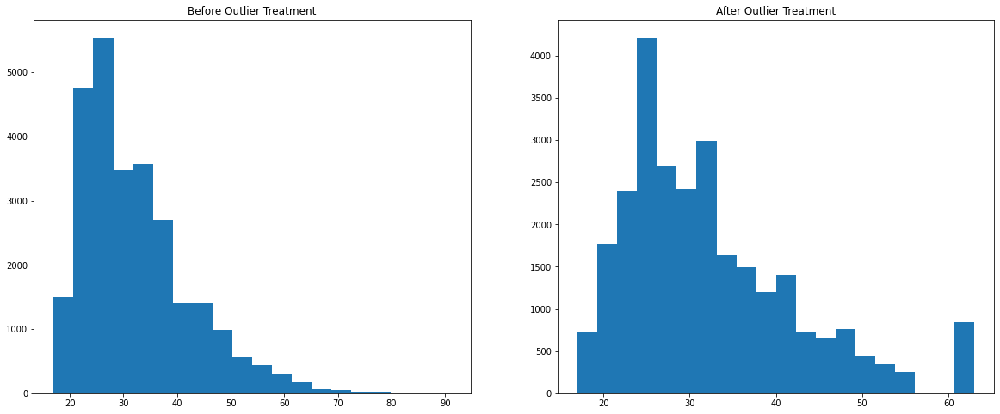

In [20]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Before Outlier Treatment')
plt.hist(churn.age,bins = 20)

plt.subplot(1,2,2)
plt.title('After Outlier Treatment')
plt.hist(churn1.age,bins = 20)

plt.show()

In [21]:
q3 = churn1['age'].quantile(0.75)
q1 = churn1['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf

55.0

In [22]:
outliers = churn[churn['age'] > uf]

In [23]:
print('Percentage of Customers who are Outliers are :')
print((len(outliers)/len(churn))*100)

Percentage of Customers who are Outliers are :
3.1037037037037036


Even after doing the outlier treatment we can see that the data is not normally distributed and there is huge spike for people who are around 60 to 65 years old, this could affect our analysis, also the percentage of outliers is very less, so its best for us to drop the outliers.

In [24]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [25]:
churn.shape

(26162, 31)

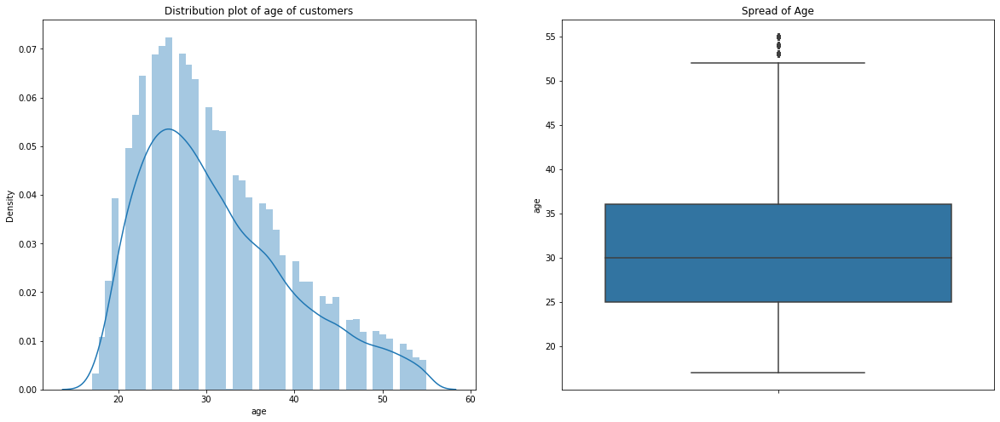

In [26]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn.age)

plt.show()

In [27]:
churn2 = churn.copy()
q3 = churn2['age'].quantile(0.75)
q1 = churn2['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn2[churn2['age'] > uf]
print('Percentage of Customers who are Outliers are :')
print((len(outliers)/len(churn2))*100)

Percentage of Customers who are Outliers are :
1.582447825089825


In [28]:
uc = churn2['age'].quantile(0.99)

for i in churn.index:
    if churn2.loc[i,'age'] > uf:
        churn2.loc[i,'age'] = uc

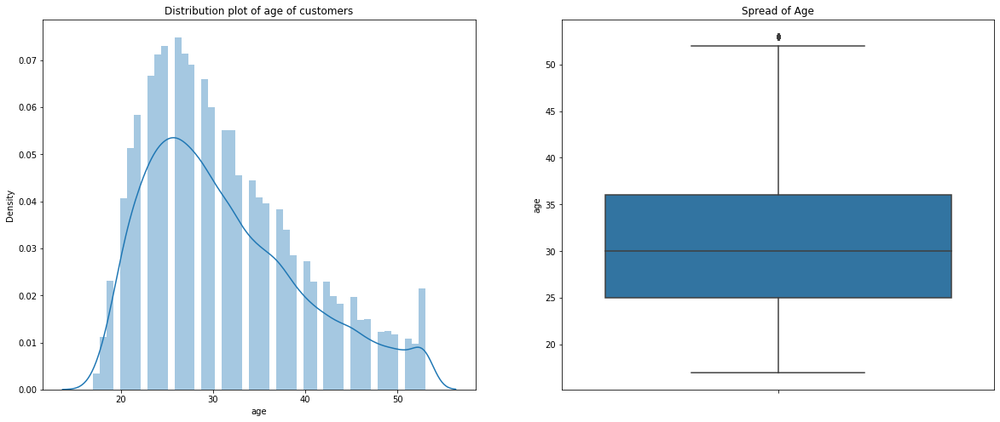

In [29]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of age of customers')
sns.distplot(churn2.age)

plt.subplot(1,2,2)
plt.title('Spread of Age')
sns.boxplot(y=churn2.age)

plt.show()

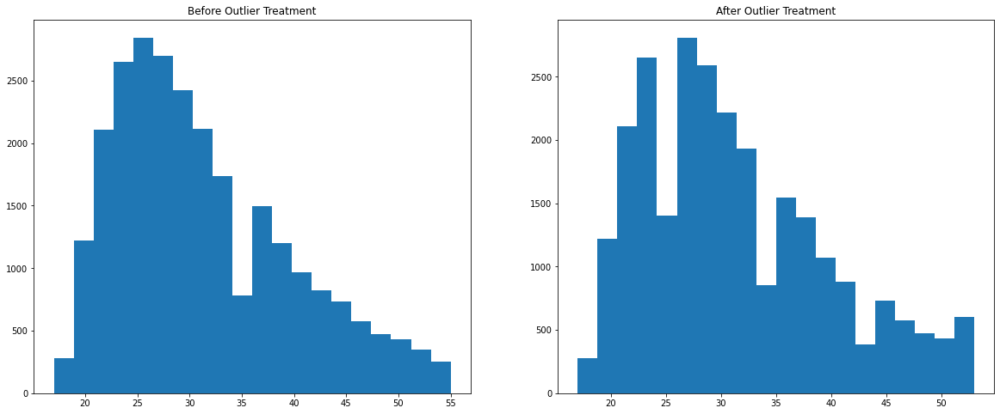

In [30]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Before Outlier Treatment')
plt.hist(churn.age,bins = 20)

plt.subplot(1,2,2)
plt.title('After Outlier Treatment')
plt.hist(churn2.age,bins = 20)

plt.show()

In [31]:
churn2['age'].skew()

0.7188657969988862

Looking at above diagram and the Boxplot we can say that after replacing Outliers with 0.99 Quantile, our Feature age is free from outliers and is slightly normally distributed. So we shall do the following changes in our Churn dataset.

In [32]:
q3 = churn['age'].quantile(0.75)
q1 = churn['age'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['age'] > uf]
uc = churn['age'].quantile(0.99)

for i in churn.index:
    if churn.loc[i,'age'] > uf:
        churn.loc[i,'age'] = uc

In [33]:
churn['age'].describe()

count    26162.000000
mean        31.251887
std          8.447707
min         17.000000
25%         25.000000
50%         30.000000
75%         36.000000
max         53.000000
Name: age, dtype: float64

In [34]:
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,Leo,1,0,NaN,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,96,0,0,5,1,1,1,1,0,0,Weekly,0,0,0,0,Leo,0,0,44.0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,285,0,0,9,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,26,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,Capricorn,0,0,33.0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,0,0,0,0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,Aries,1,0,1.0,0.03,0


In [35]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

## Null Value Treatment of Housing

In [36]:
churn['housing'].value_counts()

na    13345
R     10766
O      2051
Name: housing, dtype: int64

In [37]:
churn['housing'] = churn['housing'].replace({'na':np.nan})

In [38]:
churn.isnull().sum()

user                           0
churn                          0
age                            0
housing                    13345
credit_score                7697
deposits                       0
withdrawal                     0
purchases_partners             0
purchases                      0
cc_taken                       0
cc_recommended                 0
cc_disliked                    0
cc_liked                       0
cc_application_begin           0
app_downloaded                 0
web_user                       0
app_web_user                   0
ios_user                       0
android_user                   0
registered_phones              0
payment_type                   0
waiting_4_loan                 0
cancelled_loan                 0
received_loan                  0
rejected_loan                  0
zodiac_sign                    0
left_for_two_month_plus        0
left_for_one_month             0
rewards_earned              3020
reward_rate                    0
is_referre

In [39]:
churn.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
user,26162.0,35290.938690,20277.517100,1.0,17705.0,35596.0,53028.00,69658.0
churn,26162.0,0.416176,0.492933,0.0,0.0,0.0,1.00,1.0
age,26162.0,31.251887,8.447707,17.0,25.0,30.0,36.00,53.0
credit_score,18465.0,542.541890,60.939531,2.0,507.0,541.0,578.00,838.0
deposits,26162.0,3.334111,9.076822,0.0,0.0,0.0,1.00,65.0
withdrawal,26162.0,0.306131,1.047790,0.0,0.0,0.0,0.00,29.0
purchases_partners,26162.0,28.358765,42.447300,0.0,0.0,9.0,44.00,1067.0
purchases,26162.0,3.265232,8.896275,0.0,0.0,0.0,1.00,63.0
cc_taken,26162.0,0.072013,0.431648,0.0,0.0,0.0,0.00,29.0
cc_recommended,26162.0,93.068573,88.760985,0.0,10.0,66.0,164.00,522.0


In [40]:
churn.groupby('housing')[['purchases_partners']].mean()

,purchases_partners
housing,
O,39.756216
R,39.160970


In [41]:
pd.crosstab(churn['housing'], churn['cancelled_loan'])

cancelled_loan,0,1
housing,,
O,1998,53
R,10579,187


In [42]:
pd.crosstab(churn['housing'], churn['cancelled_loan'])/len(churn)*100

cancelled_loan,0,1
housing,,
O,7.637031,0.202584
R,40.436511,0.714777


In [43]:
pd.crosstab(churn['housing'], churn['received_loan'])

received_loan,0,1
housing,,
O,1990,61
R,10544,222


In [44]:
pd.crosstab(churn['housing'], churn['received_loan'])/len(churn)*100

received_loan,0,1
housing,,
O,7.606452,0.233163
R,40.302729,0.848559


In [45]:
pd.crosstab(churn['housing'], churn['rejected_loan'])

rejected_loan,0,1
housing,,
O,2047,4
R,10730,36


In [46]:
pd.crosstab(churn['housing'], churn['rejected_loan'])/len(churn)*100

rejected_loan,0,1
housing,,
O,7.824325,0.015289
R,41.013684,0.137604


In [47]:
pd.crosstab(churn['housing'], churn['left_for_two_month_plus'])

left_for_two_month_plus,0,1
housing,,
O,1679,372
R,8868,1898


In [48]:
pd.crosstab(churn['housing'], churn['left_for_two_month_plus'])/len(churn)*100

left_for_two_month_plus,0,1
housing,,
O,6.417705,1.421910
R,33.896491,7.254797


In [49]:
pd.crosstab(churn['housing'], churn['left_for_two_month_plus'])

left_for_two_month_plus,0,1
housing,,
O,1679,372
R,8868,1898


In [50]:
pd.crosstab(churn['housing'], churn['left_for_two_month_plus'])/len(churn)*100

left_for_two_month_plus,0,1
housing,,
O,6.417705,1.421910
R,33.896491,7.254797


In [51]:
pd.crosstab(churn['housing'], churn['left_for_one_month'])

left_for_one_month,0,1
housing,,
O,1983,68
R,10519,247


In [52]:
pd.crosstab(churn['housing'], churn['left_for_one_month'])/len(churn)*100

left_for_one_month,0,1
housing,,
O,7.579696,0.259919
R,40.207171,0.944117


In [53]:
churn['housing'].fillna(method = 'bfill',inplace = True)

Now will find similar properties after null value treatment.

In [54]:
pd.crosstab(churn['housing'], churn['cancelled_loan'])

cancelled_loan,0,1
housing,,
O,4173,96
R,21501,388


In [55]:
pd.crosstab(churn['housing'], churn['cancelled_loan'])/len(churn)*100

cancelled_loan,0,1
housing,,
O,15.950615,0.366944
R,82.184084,1.483067


In [56]:
pd.crosstab(churn['housing'], churn['received_loan'])

received_loan,0,1
housing,,
O,4167,102
R,21513,376


In [57]:
pd.crosstab(churn['housing'], churn['received_loan'])/len(churn)*100

received_loan,0,1
housing,,
O,15.927681,0.389878
R,82.229952,1.437199


In [58]:
pd.crosstab(churn['housing'], churn['rejected_loan'])

rejected_loan,0,1
housing,,
O,4250,19
R,21783,106


In [59]:
pd.crosstab(churn['housing'], churn['rejected_loan'])/len(churn)*100

rejected_loan,0,1
housing,,
O,16.244935,0.072624
R,83.261983,0.405168


In [60]:
pd.crosstab(churn['housing'], churn['left_for_two_month_plus'])

left_for_two_month_plus,0,1
housing,,
O,3499,770
R,18113,3776


In [61]:
pd.crosstab(churn['housing'], churn['left_for_two_month_plus'])/len(churn)*100

left_for_two_month_plus,0,1
housing,,
O,13.374360,2.943200
R,69.234004,14.433147


In [62]:
pd.crosstab(churn['housing'], churn['left_for_one_month'])

left_for_one_month,0,1
housing,,
O,4178,91
R,21516,373


In [63]:
pd.crosstab(churn['housing'], churn['cc_taken'])

cc_taken,0,1,2,3,4,5,6,7,8,10,11,29
housing,,,,,,,,,,,,
O,4057,141,37,20,6,3,2,1,1,0,1,0
R,20863,749,172,47,36,10,8,1,0,2,0,1


In [64]:
pd.crosstab(churn['housing'], churn['cc_taken'])/len(churn)*100

cc_taken,0,1,2,3,4,5,6,7,8,10,11,29
housing,,,,,,,,,,,,
O,15.507224,0.538950,0.141426,0.076447,0.022934,0.011467,0.007645,0.003822,0.003822,0.000000,0.003822,0.000000
R,79.745432,2.862931,0.657442,0.179650,0.137604,0.038223,0.030579,0.003822,0.000000,0.007645,0.000000,0.003822


In [65]:
pd.crosstab(churn['housing'], churn['cc_recommended'])

cc_recommended,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,318,320,321,322,323,324,326,522
housing,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
O,602,65,39,37,37,121,58,22,33,27,64,46,38,15,19,44,23,19,16,12,31,23,23,20,23,28,16,17,8,18,31,12,18,9,18,24,14,14,14,14,26,16,12,16,19,23,11,14,5,20,26,19,17,8,15,17,13,23,17,18,11,19,6,14,12,10,12,12,11,13,18,9,12,10,13,18,15,7,11,14,12,9,10,8,6,13,20,9,6,7,12,16,11,16,12,12,12,13,8,5,21,12,9,11,14,10,9,17,8,11,7,11,11,7,12,14,7,4,4,9,16,8,14,7,9,11,6,5,13,8,17,11,8,10,7,13,6,8,9,11,13,4,8,6,13,14,9,5,7,13,16,11,4,11,11,7,12,5,10,8,11,10,7,5,11,14,9,12,9,11,9,13,8,7,8,8,6,14,13,15,9,16,16,13,5,14,11,14,8,8,12,12,6,6,4,6,8,10,8,4,13,15,10,5,11,11,14,5,15,6,11,11,5,12,6,8,2,9,9,10,9,10,11,3,13,9,13,6,11,11,6,5,9,10,8,8,14,12,12,7,8,9,9,9,4,11,10,3,13,8,6,8,9,6,7,5,6,4,6,4,10,5,3,10,6,4,10,3,4,7,11,8,4,5,2,5,6,1,2,8,6,5,6,7,8,6,7,8,8,8,3,3,4,1,10,5,1,3,3,2,4,1,3,2,3,8,3,1,1,0,1,1,2,1,1,0,0,0,2,1,0,1,1,0,1
R,2947,351,188,167,230,610,270,130,128,151,328,172,128,103,108,267,137,105,106,100,209,114,83,95,127,160,111,68,82,86,164,94,62,57,91,143,97,54,59,79,126,77,57,73,88,116,82,74,60,79,111,85,75,50,98,119,101,78,52,71,105,72,57,57,79,104,79,41,62,80,97,80,64,53,69,90,73,56,63,64,92,53,58,59,61,81,62,55,52,60,60,56,56,39,46,65,59,46,48,52,72,60,53,48,54,63,62,32,50,71,62,55,51,43,60,76,63,42,46,60,80,56,50,50,43,51,66,52,65,52,70,48,51,41,68,65,45,50,38,54,72,42,45,54,57,59,53,54,50,51,48,35,39,54,54,51,51,44,48,49,52,41,37,54,61,61,57,56,40,65,60,65,55,47,46,56,48,43,39,52,60,54,52,53,47,65,49,47,39,45,51,53,54,54,51,43,60,29,41,61,49,35,42,43,57,69,53,45,39,46,45,52,46,43,40,61,52,40,38,35,40,46,38,59,32,60,36,43,41,42,47,38,30,58,57,46,37,29,39,47,47,33,33,40,38,42,33,22,40,33,37,22,30,34,43,39,23,20,26,35,46,41,22,18,35,30,22,30,23,38,35,26,26,26,33,36,18,21,15,24,25,21,21,20,26,35,11,21,15,21,31,12,19,23,24,22,18,6,14,20,35,20,7,6,23,21,4,2,6,5,2,1,0,0,1,3,1,1,3,1,1,1,0,1,0


In [66]:
pd.crosstab(churn['housing'], churn['cc_recommended'])/len(churn)*100

cc_recommended,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,318,320,321,322,323,324,326,522
housing,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
O,2.301047,0.248452,0.149071,0.141426,0.141426,0.462503,0.221696,0.084091,0.126137,0.103203,0.244630,0.175828,0.145249,0.057335,0.072624,0.168183,0.087914,0.072624,0.061157,0.045868,0.118492,0.087914,0.087914,0.076447,0.087914,0.107025,0.061157,0.064980,0.030579,0.068802,0.118492,0.045868,0.068802,0.034401,0.068802,0.091736,0.053513,0.053513,0.053513,0.053513,0.099381,0.061157,0.045868,0.061157,0.072624,0.087914,0.042046,0.053513,0.019112,0.076447,0.099381,0.072624,0.064980,0.030579,0.057335,0.064980,0.049690,0.087914,0.064980,0.068802,0.042046,0.072624,0.022934,0.053513,0.045868,0.038223,0.045868,0.045868,0.042046,0.049690,0.068802,0.034401,0.045868,0.038223,0.049690,0.068802,0.057335,0.026756,0.042046,0.053513,0.045868,0.034401,0.038223,0.030579,0.022934,0.049690,0.076447,0.034401,0.022934,0.026756,0.045868,0.061157,0.042046,0.061157,0.045868,0.045868,0.045868,0.049690,0.030579,0.019112,0.080269,0.045868,0.034401,0.042046,0.053513,0.038223,0.034401,0.064980,0.030579,0.042046,0.026756,0.042046,0.042046,0.026756,0.045868,0.053513,0.026756,0.015289,0.015289,0.034401,0.061157,0.030579,0.053513,0.026756,0.034401,0.042046,0.022934,0.019112,0.049690,0.030579,0.064980,0.042046,0.030579,0.038223,0.026756,0.049690,0.022934,0.030579,0.034401,0.042046,0.049690,0.015289,0.030579,0.022934,0.049690,0.053513,0.034401,0.019112,0.026756,0.049690,0.061157,0.042046,0.015289,0.042046,0.042046,0.026756,0.045868,0.019112,0.038223,0.030579,0.042046,0.038223,0.026756,0.019112,0.042046,0.053513,0.034401,0.045868,0.034401,0.042046,0.034401,0.049690,0.030579,0.026756,0.030579,0.030579,0.022934,0.053513,0.049690,0.057335,0.034401,0.061157,0.061157,0.049690,0.019112,0.053513,0.042046,0.053513,0.030579,0.030579,0.045868,0.045868,0.022934,0.022934,0.015289,0.022934,0.030579,0.038223,0.030579,0.015289,0.049690,0.057335,0.038223,0.019112,0.042046,0.042046,0.053513,0.019112,0.057335,0.022934,0.042046,0.042046,0.019112,0.045868,0.022934,0.030579,0.007645,0.034401,0.034401,0.038223,0.034401,0.038223,0.042046,0.011467,0.049690,0.034401,0.049690,0.022934,0.042046,0.042046,0.022934,0.019112,0.034401,0.038223,0.030579,0.030579,0.053513,0.045868,0.045868,0.026756,0.030579,0.034401,0.034401,0.034401,0.015289,0.042046,0.038223,0.011467,0.049690,0.030579,0.022934,0.030579,0.034401,0.022934,0.026756,0.019112,0.022934,0.015289,0.022934,0.015289,0.038223,0.019112,0.011467,0.038223,0.022934,0.015289,0.038223,0.011467,0.015289,0.026756,0.042046,0.030579,0.015289,0.0

In [67]:
churn['housing'].value_counts()/len(churn) * 100

R    83.667151
O    16.317560
Name: housing, dtype: float64

In [68]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       4
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [69]:
churn['housing'] = churn['housing'].replace({np.nan : 'R'})

In [70]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

After Finding no conclusive relation of housing with other features, we imputed null values with backward fill.

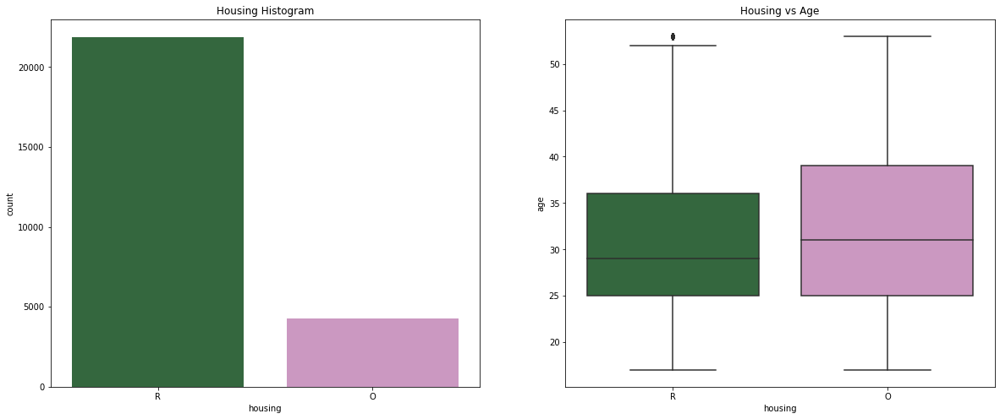

In [71]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Housing Histogram')
sns.countplot(churn.housing, palette=("cubehelix"))

plt.subplot(1,2,2)
plt.title('Housing vs Age')
sns.boxplot(x=churn.housing, y=churn.age, palette=("cubehelix"))

plt.show()

We can observe that Most of our Customer Base stay in a Rented Apartment, although the median age for both (the customers staying in own house or customers living in a rented apartment) are almost equal.

In [72]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [73]:
churn['credit_score'].describe()

count    18465.000000
mean       542.541890
std         60.939531
min          2.000000
25%        507.000000
50%        541.000000
75%        578.000000
max        838.000000
Name: credit_score, dtype: float64

In [74]:
churn['credit_score'].quantile(0.15)

485.0

In [75]:
churn['credit_score'].quantile(0.90)

617.6000000000022

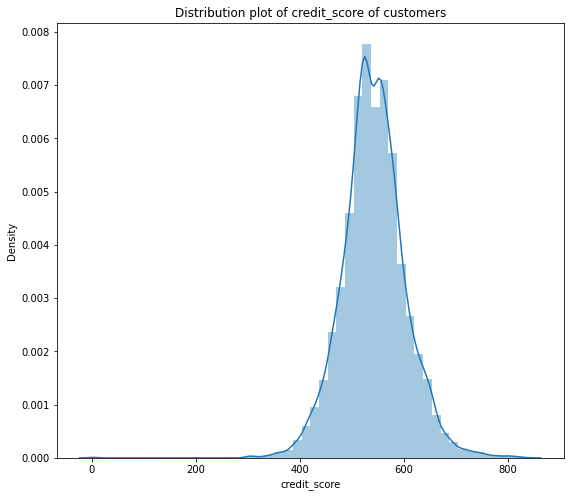

In [76]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of credit_score of customers')
sns.distplot(churn.credit_score)

We can observe that majority of customers have a credit score between 450 to 600.

In [77]:
churn.corr()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
user,1.000000,0.069604,-0.052835,-0.049694,-0.183147,-0.112802,-0.295442,-0.183241,-0.077201,-0.521347,-0.037161,-0.027863,-0.318530,-0.291415,-0.050120,-0.162084,-0.041268,-0.092506,-0.095727,0.017702,0.005228,-0.030183,0.027624,-0.026372,-0.029833,-0.454162,-0.487251,-0.162633
churn,0.069604,1.000000,-0.060911,-0.120893,-0.134879,-0.068988,-0.263890,-0.135394,0.059451,-0.199769,0.008831,0.011326,-0.117552,-0.058870,0.039534,0.015066,0.020489,-0.040404,0.029200,-0.015390,0.034856,0.050412,0.056633,0.007004,0.037538,-0.169597,-0.168290,-0.083421
age,-0.052835,-0.060911,1.000000,0.026389,0.108228,0.051786,0.025738,0.107917,0.079338,0.137664,0.009435,0.020810,0.180885,-0.084043,0.208614,0.172036,0.175953,-0.212764,-0.004591,0.004953,-0.014201,0.000899,0.009690,-0.023456,0.033463,0.157907,0.129386,0.019101
credit_score,-0.049694,-0.120893,0.026389,1.000000,0.043215,0.004700,0.051705,0.044201,0.025253,0.126841,0.014533,0.027872,0.080105,0.019918,0.000113,0.005732,-0.039200,0.035271,-0.012172,0.021473,0.068916,0.091452,0.016732,0.011069,0.011120,0.145615,0.153006,-0.032474
deposits,-0.183147,-0.134879,0.108228,0.043215,1.000000,0.487825,0.328313,0.998502,-0.045859,0.375680,-0.014600,-0.011534,0.450604,0.079193,0.077457,0.106911,0.043032,-0.004344,0.041395,-0.002731,0.012916,-0.008858,-0.018741,0.048210,-0.010785,0.249169,0.266690,0.227595
withdrawal,-0.112802,-0.068988,0.051786,0.004700,0.487825,1.000000,0.225510,0.487213,-0.039871,0.187818,-0.011031,-0.002479,0.296332,0.062990,0.047395,0.071010,0.040265,-0.006432,0.048895,0.002624,-0.001940,-0.006355,-0.010840,0.033568,-0.008304,0.095742,0.126071,0.208541
purchases_partners,-0.295442,-0.263890,0.025738,0.051705,0.328313,0.225510,1.000000,0.328319,-0.100473,0.595327,-0.035500,-0.032492,0.422642,0.144030,0.067007,0.121553,0.029049,0.044874,0.070932,0.000170,0.016342,-0.014090,-0.030648,0.083505,-0.030691,0.404912,0.432056,0.299391
purchases,-0.183241,-0.135394,0.107917,0.044201,0.998502,0.487213,0.328319,1.000000,-0.045876,0.376263,-0.014500,-0.011620,0.451095,0.079131,0.077036,0.106471,0.042150,-0.003499,0.041056,-0.002507,0.013221,-0.008687,-0.018583,0.048533,-0.010973,0.249769,0.267230,0.227736
cc_taken,-0.077201,0.059451,0.079338,0.025253,-0.045859,-0.039871,-0.100473,-0.045876,1.000000,0.115005,0.183383,0.156610,0.160361,0.035968,0.057509,0.070592,0.063222,-0.044934,0.040852,-0.006018,0.003382,0.045344,0.006301,-0.016477,0.086271,0.149301,0.148951,-0.022561
cc_recommended,-0.521347,-0.199769,0.137664,0.126841,0.375680,0.187818,0.595327,0.376263,0.115005,1.000000,0.047461,0.054928,0.615342,0.224874,0.134309,0.219531,0.021992,0.089910,0.125625,-0.017982,0.016196,0.045300,-0.037096,0.045275,0.038814,0.915700,0.876315,0.239041


## Null value treatment for payment type

In [78]:
churn.groupby('payment_type')[['rewards_earned']].mean()

,rewards_earned
payment_type,
Bi-Weekly,29.104596
Monthly,27.813793
Semi-Monthly,30.077965
Weekly,28.650195
na,29.980531


In [79]:
cat_cols = churn.select_dtypes(include = 'object')
print('Categorical Columns are : ',cat_cols.columns)
print('% Values in each categorical columns')
for i in cat_cols.columns:
    print('\n% Values in column ',i)
    print((churn[i].value_counts()/len(churn[i])*100))

Categorical Columns are :  Index(['housing', 'payment_type', 'zodiac_sign'], dtype='object')
% Values in each categorical columns

% Values in column  housing
R    83.68244
O    16.31756
Name: housing, dtype: float64

% Values in column  payment_type
Bi-Weekly       47.614861
Weekly          19.799710
na              14.421680
Semi-Monthly     9.104809
Monthly          9.058940
Name: payment_type, dtype: float64

% Values in column  zodiac_sign
Cancer         8.990138
Virgo          8.906047
Leo            8.833423
Taurus         8.290651
Gemini         7.988686
na             7.958107
Pisces         7.896950
Libra          7.896950
Aquarius       7.828148
Scorpio        7.801391
Sagittarius    7.633208
Aries          7.461203
Capricorn      2.515098
Name: zodiac_sign, dtype: float64


In [80]:
churn['payment_type'] = churn['payment_type'].replace({'na':np.nan})

In [81]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type               3773
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3020
reward_rate                   0
is_referred                   0
dtype: i

In [82]:
(churn['payment_type'].value_counts()/len(churn)) * 100

Bi-Weekly       47.614861
Weekly          19.799710
Semi-Monthly     9.104809
Monthly          9.058940
Name: payment_type, dtype: float64

In [83]:
churn['payment_type'].mode()

0    Bi-Weekly
dtype: object

In [84]:
churn['payment_type'] = churn['payment_type'].fillna(churn['payment_type'].mode()[0])

In [85]:
churn['payment_type'].value_counts()

Bi-Weekly       16230
Weekly           5180
Semi-Monthly     2382
Monthly          2370
Name: payment_type, dtype: int64

In [86]:
(churn['payment_type'].value_counts()/len(churn)) * 100

Bi-Weekly       62.036542
Weekly          19.799710
Semi-Monthly     9.104809
Monthly          9.058940
Name: payment_type, dtype: float64

As around 50 % of users paid Bi-Weekly, so we imputed the nul values with Bi-Weekly.

## Null value treatment for Zodiac sign

In [87]:
churn.drop(columns = 'zodiac_sign',inplace = True)

- As we dont think Zodiac sign would help our dataset. we may drop as it wont be helpful in further calculation.

## Null Value and Outlier Treatment for Rewards earned

Skewness in rewards_earned is  0.37696135588861784


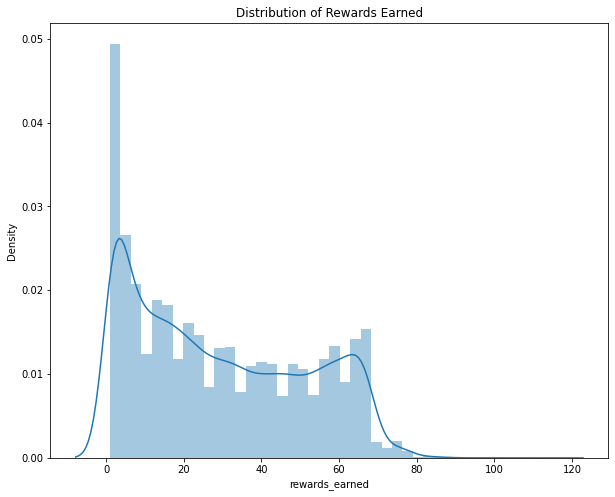

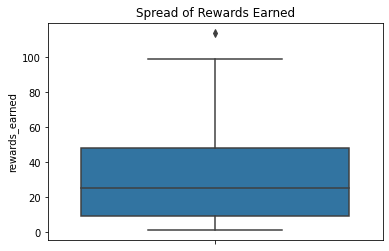

In [88]:
print('Skewness in rewards_earned is ',churn['rewards_earned'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Rewards Earned')
sns.distplot(churn.rewards_earned)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Rewards Earned')
sns.boxplot(y=churn.rewards_earned)

plt.show()

- We can observe that Rewards_earned is slightly Right Skewed.

In [89]:
q3 = churn['rewards_earned'].quantile(0.75)
q1 = churn['rewards_earned'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['rewards_earned'] > uf]

outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
7615,13563,0,28.0,O,563.0,42,4,268,42,0,522,0,0,100,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,114.0,3.8,1


There is only 1 outlier in Rewards Earned, its better to drop it.

In [90]:
for i in outliers.index:
    churn.drop(i,inplace = True)

Skewness in rewards_earned is  0.3753174643202602


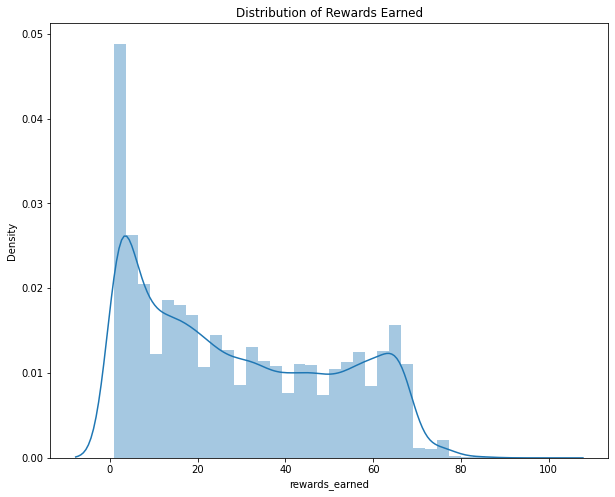

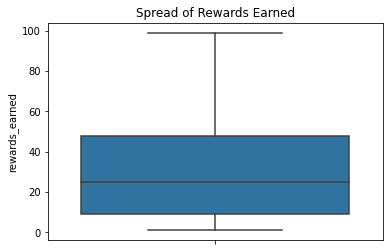

In [91]:
print('Skewness in rewards_earned is ',churn['rewards_earned'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Rewards Earned')
sns.distplot(churn.rewards_earned)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Rewards Earned')
sns.boxplot(y=churn.rewards_earned)

plt.show()

In [92]:
churn.groupby('payment_type')[['rewards_earned']].median()

,rewards_earned
payment_type,
Bi-Weekly,25.0
Monthly,23.0
Semi-Monthly,26.0
Weekly,24.0


In [93]:
churn.corr()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
user,1.000000,0.069572,-0.052853,-0.049678,-0.183040,-0.112687,-0.295397,-0.183133,-0.077210,-0.521394,-0.037164,-0.027866,-0.318575,-0.291413,-0.050088,-0.162054,-0.041302,-0.092476,-0.095748,0.017701,0.005222,-0.030189,0.027622,-0.026391,-0.029839,-0.454154,-0.487242,-0.162584
churn,0.069572,1.000000,-0.060924,-0.120880,-0.134790,-0.068891,-0.263872,-0.135305,0.059446,-0.199705,0.008829,0.011325,-0.117438,-0.058864,0.039562,0.015096,0.020464,-0.040378,0.029185,-0.015391,0.034852,0.050408,0.056632,0.006990,0.037534,-0.169518,-0.168216,-0.083379
age,-0.052853,-0.060924,1.000000,0.026397,0.108328,0.051850,0.025837,0.108021,0.079336,0.137797,0.009434,0.020809,0.181194,-0.084040,0.208630,0.172052,0.175944,-0.212756,-0.004598,0.004952,-0.014203,0.000897,0.009689,-0.023463,0.033461,0.158023,0.129479,0.019124
credit_score,-0.049678,-0.120880,0.026397,1.000000,0.043164,0.004645,0.051649,0.044150,0.025257,0.126831,0.014535,0.027873,0.080083,0.019915,0.000099,0.005718,-0.039186,0.035257,-0.012164,0.021474,0.068918,0.091455,0.016734,0.011077,0.011123,0.145604,0.152996,-0.032499
deposits,-0.183040,-0.134790,0.108328,0.043164,1.000000,0.487536,0.327707,0.998502,-0.045848,0.375191,-0.014596,-0.011529,0.450021,0.079186,0.077352,0.106805,0.043178,-0.004480,0.041484,-0.002726,0.012943,-0.008839,-0.018736,0.048301,-0.010767,0.248667,0.266232,0.227446
withdrawal,-0.112687,-0.068891,0.051850,0.004645,0.487536,1.000000,0.224939,0.486919,-0.039858,0.187295,-0.011026,-0.002472,0.295707,0.062976,0.047297,0.070908,0.040383,-0.006546,0.048969,0.002630,-0.001922,-0.006338,-0.010834,0.033638,-0.008288,0.095243,0.125618,0.208402
purchases_partners,-0.295397,-0.263872,0.025837,0.051649,0.327707,0.224939,1.000000,0.327697,-0.100499,0.594912,-0.035509,-0.032500,0.421729,0.144071,0.066872,0.121437,0.029240,0.044723,0.071075,0.000178,0.016381,-0.014069,-0.030651,0.083655,-0.030681,0.404396,0.431611,0.299272
purchases,-0.183133,-0.135305,0.108021,0.044150,0.998502,0.486919,0.327697,1.000000,-0.045865,0.375762,-0.014496,-0.011615,0.450493,0.079124,0.076928,0.106363,0.042299,-0.003638,0.041148,-0.002502,0.013248,-0.008667,-0.018578,0.048627,-0.010954,0.249257,0.266762,0.227585
cc_taken,-0.077210,0.059446,0.079336,0.025257,-0.045848,-0.039858,-0.100499,-0.045865,1.000000,0.115087,0.183383,0.156610,0.160584,0.035970,0.057515,0.070599,0.063217,-0.044929,0.040849,-0.006019,0.003381,0.045343,0.006301,-0.016480,0.086270,0.149379,0.149018,-0.022553
cc_recommended,-0.521394,-0.199705,0.137797,0.126831,0.375191,0.187295,0.594912,0.375762,0.115087,1.000000,0.047493,0.054963,0.614892,0.224935,0.134219,0.219468,0.022150,0.089798,0.125767,-0.017983,0.016228,0.045345,-0.037100,0.045381,0.038856,0.915649,0.876243,0.238888


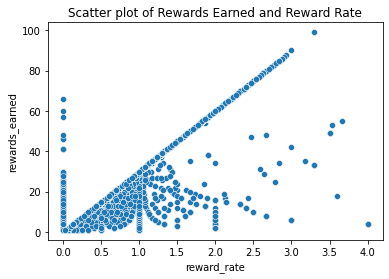

In [94]:
sns.scatterplot(churn['reward_rate'], churn['rewards_earned'])
plt.title('Scatter plot of Rewards Earned and Reward Rate')
plt.show()

In [95]:
churn['rewards_earned'].value_counts()

2.0     1242
1.0     1201
4.0      690
3.0      633
6.0      520
8.0      487
5.0      448
67.0     441
7.0      417
15.0     415
13.0     408
14.0     393
9.0      389
17.0     386
10.0     386
11.0     386
18.0     377
12.0     368
19.0     358
65.0     355
21.0     347
16.0     332
66.0     331
22.0     329
20.0     326
25.0     320
23.0     309
33.0     307
64.0     298
58.0     293
62.0     287
29.0     282
24.0     281
28.0     276
61.0     274
59.0     271
31.0     269
26.0     267
60.0     266
44.0     262
30.0     260
27.0     260
37.0     257
56.0     256
32.0     250
48.0     249
40.0     248
34.0     247
54.0     243
55.0     241
57.0     239
35.0     239
46.0     237
51.0     234
39.0     234
47.0     234
63.0     232
41.0     232
36.0     230
53.0     227
52.0     224
42.0     224
45.0     222
49.0     215
43.0     213
50.0     201
38.0     194
68.0     182
69.0      78
76.0      56
75.0      43
70.0      39
71.0      33
77.0      31
72.0      26
74.0      23
73.0      16

In [96]:
(churn['rewards_earned'].value_counts()/len(churn)) * 100

2.0     4.747525
1.0     4.590803
4.0     2.637514
3.0     2.419632
6.0     1.987692
8.0     1.861550
5.0     1.712473
67.0    1.685715
7.0     1.593976
15.0    1.586331
13.0    1.559573
14.0    1.502236
9.0     1.486946
17.0    1.475479
10.0    1.475479
11.0    1.475479
18.0    1.441076
12.0    1.406674
19.0    1.368449
65.0    1.356982
21.0    1.326402
16.0    1.269065
66.0    1.265242
22.0    1.257597
20.0    1.246130
25.0    1.223195
23.0    1.181148
33.0    1.173503
64.0    1.139100
58.0    1.119988
62.0    1.097053
29.0    1.077940
24.0    1.074118
28.0    1.055006
61.0    1.047361
59.0    1.035893
31.0    1.028248
26.0    1.020603
60.0    1.016781
44.0    1.001491
30.0    0.993846
27.0    0.993846
37.0    0.982378
56.0    0.978556
32.0    0.955621
48.0    0.951798
40.0    0.947976
34.0    0.944154
54.0    0.928864
55.0    0.921219
57.0    0.913574
35.0    0.913574
46.0    0.905929
51.0    0.894461
39.0    0.894461
47.0    0.894461
63.0    0.886816
41.0    0.886816
36.0    0.8791

In [97]:
ind = churn[churn['rewards_earned'].isnull()].index
ind

Int64Index([    0,    18,    21,    43,    53,    57,    89,    90,    95,
              100,
            ...
            26918, 26922, 26925, 26946, 26956, 26958, 26971, 26975, 26980,
            26983],
           dtype='int64', length=3020)

In [98]:
np.random.seed(1)
for i in ind:
    if churn.loc[i,'reward_rate'] > 1.5:
        churn.loc[i,'rewards_earned'] = np.random.randint(1,9)
    else:
        churn.loc[i,'rewards_earned'] = np.random.randint(1,9)

In [99]:
churn['rewards_earned'].describe()

count    26161.00000
mean        26.27671
std         22.09252
min          1.00000
25%          6.00000
50%         20.00000
75%         45.00000
max         99.00000
Name: rewards_earned, dtype: float64

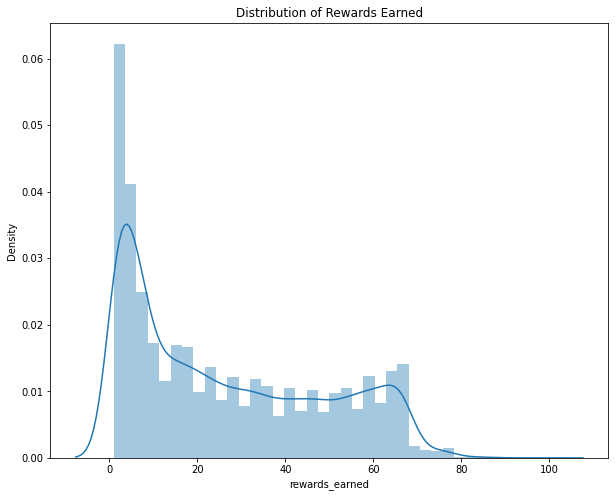

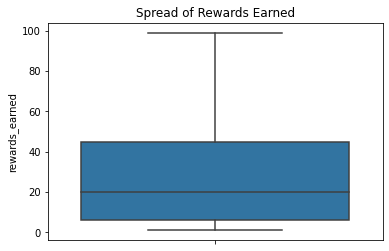

In [100]:
plt.figure(figsize = (10,8))
plt.title('Distribution of Rewards Earned')
sns.distplot(churn.rewards_earned)
plt.show()

plt.title('Spread of Rewards Earned')
sns.boxplot(y=churn.rewards_earned)

plt.show()

In [101]:
(churn['rewards_earned'].value_counts()/len(churn)) * 100

2.0     6.108329
1.0     6.035702
4.0     4.063300
3.0     3.906578
6.0     3.382898
8.0     3.279691
5.0     3.165017
7.0     3.153549
67.0    1.685715
15.0    1.586331
13.0    1.559573
14.0    1.502236
9.0     1.486946
11.0    1.475479
10.0    1.475479
17.0    1.475479
18.0    1.441076
12.0    1.406674
19.0    1.368449
65.0    1.356982
21.0    1.326402
16.0    1.269065
66.0    1.265242
22.0    1.257597
20.0    1.246130
25.0    1.223195
23.0    1.181148
33.0    1.173503
64.0    1.139100
58.0    1.119988
62.0    1.097053
29.0    1.077940
24.0    1.074118
28.0    1.055006
61.0    1.047361
59.0    1.035893
31.0    1.028248
26.0    1.020603
60.0    1.016781
44.0    1.001491
27.0    0.993846
30.0    0.993846
37.0    0.982378
56.0    0.978556
32.0    0.955621
48.0    0.951798
40.0    0.947976
34.0    0.944154
54.0    0.928864
55.0    0.921219
35.0    0.913574
57.0    0.913574
46.0    0.905929
47.0    0.894461
39.0    0.894461
51.0    0.894461
63.0    0.886816
41.0    0.886816
36.0    0.8791

As most of our observations in Rewards_Earned were in thr range of 1 to 8, we imputed null values in this range. We can see that there is no change in the distribution as well, we took reward rate as feature to fill in the null values because reward_earned was highly correlated reward_rate.

In [102]:
churn.isnull().sum()

user                          0
churn                         0
age                           0
housing                       0
credit_score               7697
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned                0
reward_rate                   0
is_referred                   0
dtype: int64

In [103]:
churn['credit_score'].describe()

count    18464.000000
mean       542.540782
std         60.940995
min          2.000000
25%        507.000000
50%        541.000000
75%        578.000000
max        838.000000
Name: credit_score, dtype: float64

Skewness in rewards_earned is  0.054599076185737797


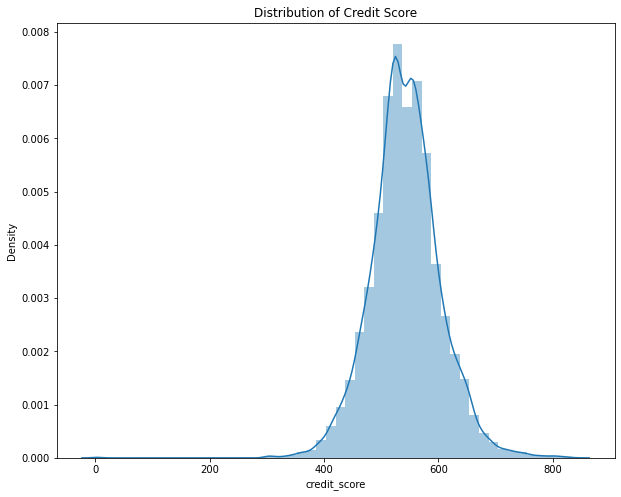

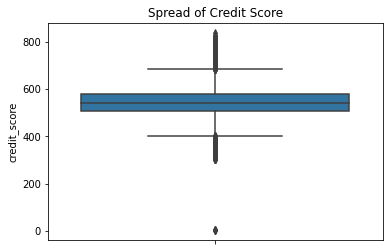

In [104]:
print('Skewness in rewards_earned is ',churn['credit_score'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Credit Score')
sns.distplot(churn.credit_score)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Credit Score')
sns.boxplot(y=churn.credit_score)

plt.show()

- Credit Score is kind of left skewed,and there are too many outliers in credit score.

In [105]:
churn.corr()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
user,1.000000,0.069572,-0.052853,-0.049678,-0.183040,-0.112687,-0.295397,-0.183133,-0.077210,-0.521394,-0.037164,-0.027866,-0.318575,-0.291413,-0.050088,-0.162054,-0.041302,-0.092476,-0.095748,0.017701,0.005222,-0.030189,0.027622,-0.026391,-0.029839,-0.513995,-0.487242,-0.162584
churn,0.069572,1.000000,-0.060924,-0.120880,-0.134790,-0.068891,-0.263872,-0.135305,0.059446,-0.199705,0.008829,0.011325,-0.117438,-0.058864,0.039562,0.015096,0.020464,-0.040378,0.029185,-0.015391,0.034852,0.050408,0.056632,0.006990,0.037534,-0.178803,-0.168216,-0.083379
age,-0.052853,-0.060924,1.000000,0.026397,0.108328,0.051850,0.025837,0.108021,0.079336,0.137797,0.009434,0.020809,0.181194,-0.084040,0.208630,0.172052,0.175944,-0.212756,-0.004598,0.004952,-0.014203,0.000897,0.009689,-0.023463,0.033461,0.136677,0.129479,0.019124
credit_score,-0.049678,-0.120880,0.026397,1.000000,0.043164,0.004645,0.051649,0.044150,0.025257,0.126831,0.014535,0.027873,0.080083,0.019915,0.000099,0.005718,-0.039186,0.035257,-0.012164,0.021474,0.068918,0.091455,0.016734,0.011077,0.011123,0.143777,0.152996,-0.032499
deposits,-0.183040,-0.134790,0.108328,0.043164,1.000000,0.487536,0.327707,0.998502,-0.045848,0.375191,-0.014596,-0.011529,0.450021,0.079186,0.077352,0.106805,0.043178,-0.004480,0.041484,-0.002726,0.012943,-0.008839,-0.018736,0.048301,-0.010767,0.276930,0.266232,0.227446
withdrawal,-0.112687,-0.068891,0.051850,0.004645,0.487536,1.000000,0.224939,0.486919,-0.039858,0.187295,-0.011026,-0.002472,0.295707,0.062976,0.047297,0.070908,0.040383,-0.006546,0.048969,0.002630,-0.001922,-0.006338,-0.010834,0.033638,-0.008288,0.124746,0.125618,0.208402
purchases_partners,-0.295397,-0.263872,0.025837,0.051649,0.327707,0.224939,1.000000,0.327697,-0.100499,0.594912,-0.035509,-0.032500,0.421729,0.144071,0.066872,0.121437,0.029240,0.044723,0.071075,0.000178,0.016381,-0.014069,-0.030651,0.083655,-0.030681,0.451306,0.431611,0.299272
purchases,-0.183133,-0.135305,0.108021,0.044150,0.998502,0.486919,0.327697,1.000000,-0.045865,0.375762,-0.014496,-0.011615,0.450493,0.079124,0.076928,0.106363,0.042299,-0.003638,0.041148,-0.002502,0.013248,-0.008667,-0.018578,0.048627,-0.010954,0.277455,0.266762,0.227585
cc_taken,-0.077210,0.059446,0.079336,0.025257,-0.045848,-0.039858,-0.100499,-0.045865,1.000000,0.115087,0.183383,0.156610,0.160584,0.035970,0.057515,0.070599,0.063217,-0.044929,0.040849,-0.006019,0.003381,0.045343,0.006301,-0.016480,0.086270,0.158005,0.149018,-0.022553
cc_recommended,-0.521394,-0.199705,0.137797,0.126831,0.375191,0.187295,0.594912,0.375762,0.115087,1.000000,0.047493,0.054963,0.614892,0.224935,0.134219,0.219468,0.022150,0.089798,0.125767,-0.017983,0.016228,0.045345,-0.037100,0.045381,0.038856,0.925039,0.876243,0.238888


## Null Value Treatment for Credit Score

In [106]:
churn['cc_recommended'].describe()

count    26161.000000
mean        93.052177
std         88.723054
min          0.000000
25%         10.000000
50%         66.000000
75%        164.000000
max        326.000000
Name: cc_recommended, dtype: float64

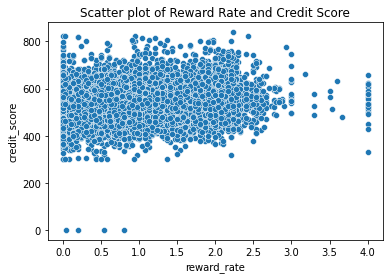

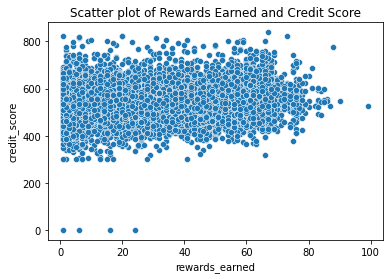

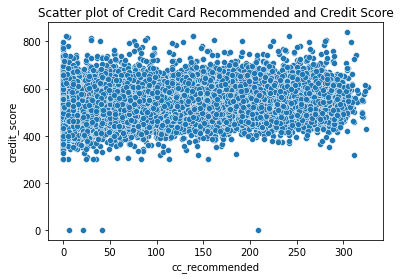

In [107]:
sns.scatterplot(churn['reward_rate'], churn['credit_score'])
plt.title('Scatter plot of Reward Rate and Credit Score')
plt.show()

sns.scatterplot(churn['rewards_earned'], churn['credit_score'])
plt.title('Scatter plot of Rewards Earned and Credit Score')
plt.show()

sns.scatterplot(churn['cc_recommended'], churn['credit_score'])
plt.title('Scatter plot of Credit Card Recommended and Credit Score')
plt.show()

In [108]:
ind = churn[churn['credit_score'].isnull()].index
ind

Int64Index([    0,     4,     7,    10,    14,    15,    18,    19,    24,
               29,
            ...
            26975, 26978, 26980, 26981, 26983, 26985, 26988, 26991, 26996,
            26997],
           dtype='int64', length=7697)

In [109]:
np.random.seed(1)
for i in ind:
    churn.loc[i,'credit_score'] = np.random.randint(420,500)

In [110]:
churn['credit_score'].describe()

count    26161.000000
mean       518.156072
std         64.849435
min          2.000000
25%        469.000000
50%        513.000000
75%        561.000000
max        838.000000
Name: credit_score, dtype: float64

Skewness in rewards_earned is  0.4550099195012546


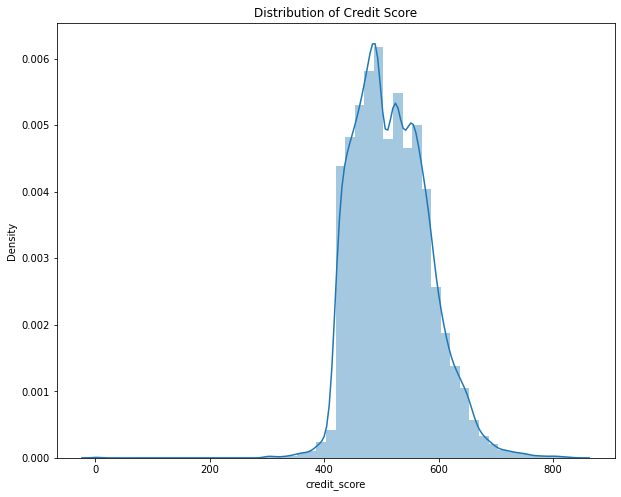

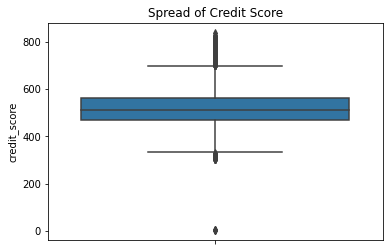

In [111]:
print('Skewness in rewards_earned is ',churn['credit_score'].skew())

# plt.subplot(1,2,1)
plt.figure(figsize = (10,8))
plt.title('Distribution of Credit Score')
sns.distplot(churn.credit_score)
plt.show()

# plt.subplot(1,2,2)
plt.title('Spread of Credit Score')
sns.boxplot(y=churn.credit_score)

plt.show()

In [112]:
churn.isnull().sum()

user                       0
churn                      0
age                        0
housing                    0
credit_score               0
deposits                   0
withdrawal                 0
purchases_partners         0
purchases                  0
cc_taken                   0
cc_recommended             0
cc_disliked                0
cc_liked                   0
cc_application_begin       0
app_downloaded             0
web_user                   0
app_web_user               0
ios_user                   0
android_user               0
registered_phones          0
payment_type               0
waiting_4_loan             0
cancelled_loan             0
received_loan              0
rejected_loan              0
left_for_two_month_plus    0
left_for_one_month         0
rewards_earned             0
reward_rate                0
is_referred                0
dtype: int64

- We tried if we could find any high correlation of Credit Score with any other feature, so that we could impute the null values using that feature, but however we could not find any such correlation. We didn't want to drop to credit score as we believe it could be one of the most important feature in our Data AnalysisAs most of the variable in Credit Score were in a range of 420 to 500, we imputed null values with random values within this range. After imputing we could see that there has not been any change in our distribution which is good indicator that we might have imputed null values in a correct manner. We could have have imputed null values within range of 420 to 600, but since 600 is a high credit score, we didn't want to assign null values near 600, as it could affect our analysis a person with a low credit score could get a credit score around 600 which is not right.

- Now our dataset contains no null value, so we shall proceed with Data Understanding and Outlier Treatment.

## Data Understanding

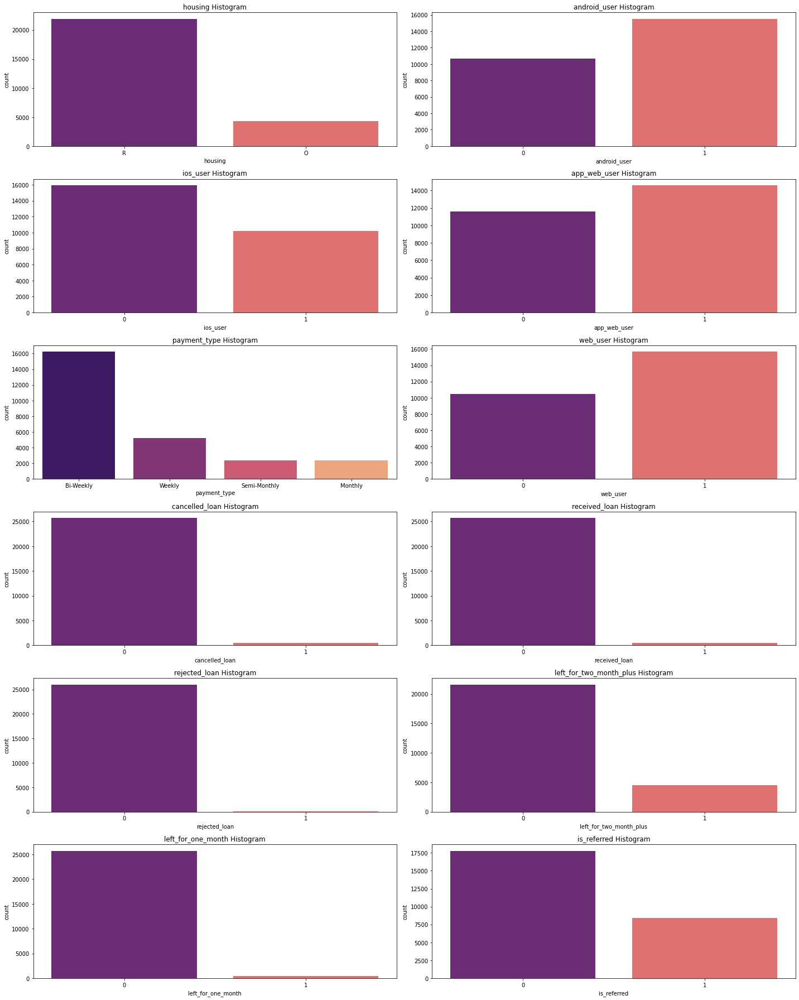

In [113]:
def plot_count(x,fig):
    plt.subplot(6,2,fig)
    plt.title(x+' Histogram')
    sns.countplot(churn[x],palette=("magma"))
    
plt.figure(figsize=(20,25))

plot_count('housing',1)
plot_count('android_user',2)
plot_count('ios_user',3)
plot_count('app_web_user',4)
plot_count('payment_type',5)
plot_count('web_user',6)
plot_count('cancelled_loan',7)
plot_count('received_loan',8)
plot_count('rejected_loan',9)
plot_count('left_for_two_month_plus',10)
plot_count('left_for_one_month',11)
plot_count('is_referred',12)

plt.tight_layout()

#### Inference :

1) Most of our user stay in an `Rented Accomodation`, this may be beacuse as majority of our users are in the age group of 25 to 35.\
2) Majority of our user's own an `Android` phone, rather than an `IOS` Phone.\
3) Also most of the customers/users who use `web` also have downloaded the `app`.\
4) We cannot make much inference out of `Received Loan`, `Cancelled Loan` and `Rejected Loan`.\
5) Most of the users did't leave us either for `one month` or `more than 2 months`.\
6) Around `30%` of the customers have been `referred` about us. Which shows a good sign.\
7) `60%` of the customers prefer to make payments `bi-weekly`.\
8) We have `equal` number of customer from every `zodiac sign`, barring Capricorn.

In [114]:
churn.columns

Index(['user', 'churn', 'age', 'housing', 'credit_score', 'deposits',
       'withdrawal', 'purchases_partners', 'purchases', 'cc_taken',
       'cc_recommended', 'cc_disliked', 'cc_liked', 'cc_application_begin',
       'app_downloaded', 'web_user', 'app_web_user', 'ios_user',
       'android_user', 'registered_phones', 'payment_type', 'waiting_4_loan',
       'cancelled_loan', 'received_loan', 'rejected_loan',
       'left_for_two_month_plus', 'left_for_one_month', 'rewards_earned',
       'reward_rate', 'is_referred'],
      dtype='object')

In [115]:
num_cols = churn.select_dtypes(include = np.number)

In [116]:
print('Numerical variables are : ',num_cols.columns)

Numerical variables are :  Index(['user', 'churn', 'age', 'credit_score', 'deposits', 'withdrawal',
       'purchases_partners', 'purchases', 'cc_taken', 'cc_recommended',
       'cc_disliked', 'cc_liked', 'cc_application_begin', 'app_downloaded',
       'web_user', 'app_web_user', 'ios_user', 'android_user',
       'registered_phones', 'waiting_4_loan', 'cancelled_loan',
       'received_loan', 'rejected_loan', 'left_for_two_month_plus',
       'left_for_one_month', 'rewards_earned', 'reward_rate', 'is_referred'],
      dtype='object')


In [117]:
num_cols.shape

(26161, 28)

ValueError: ignored

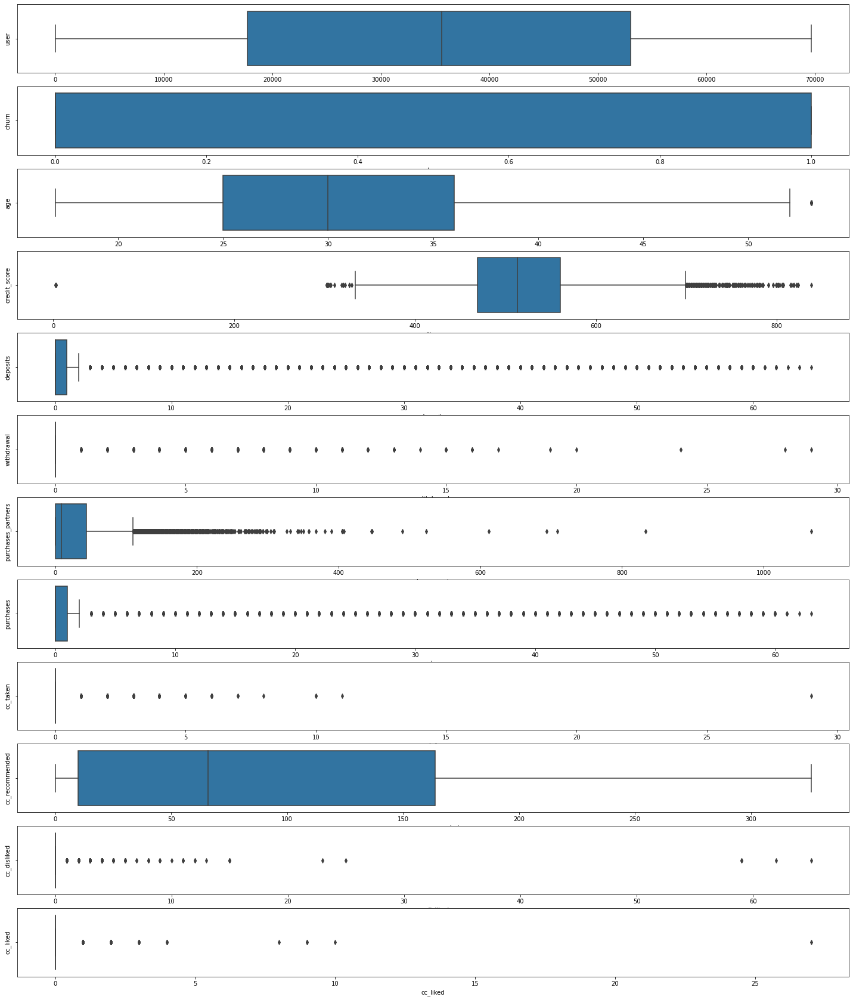

In [118]:
plt.figure(figsize=(25,30))
for i,col in enumerate(num_cols,1):
    plt.subplot(12,1,i)
    sns.boxplot(churn[col])
    plt.ylabel(col)
plt.show()

ValueError: ignored

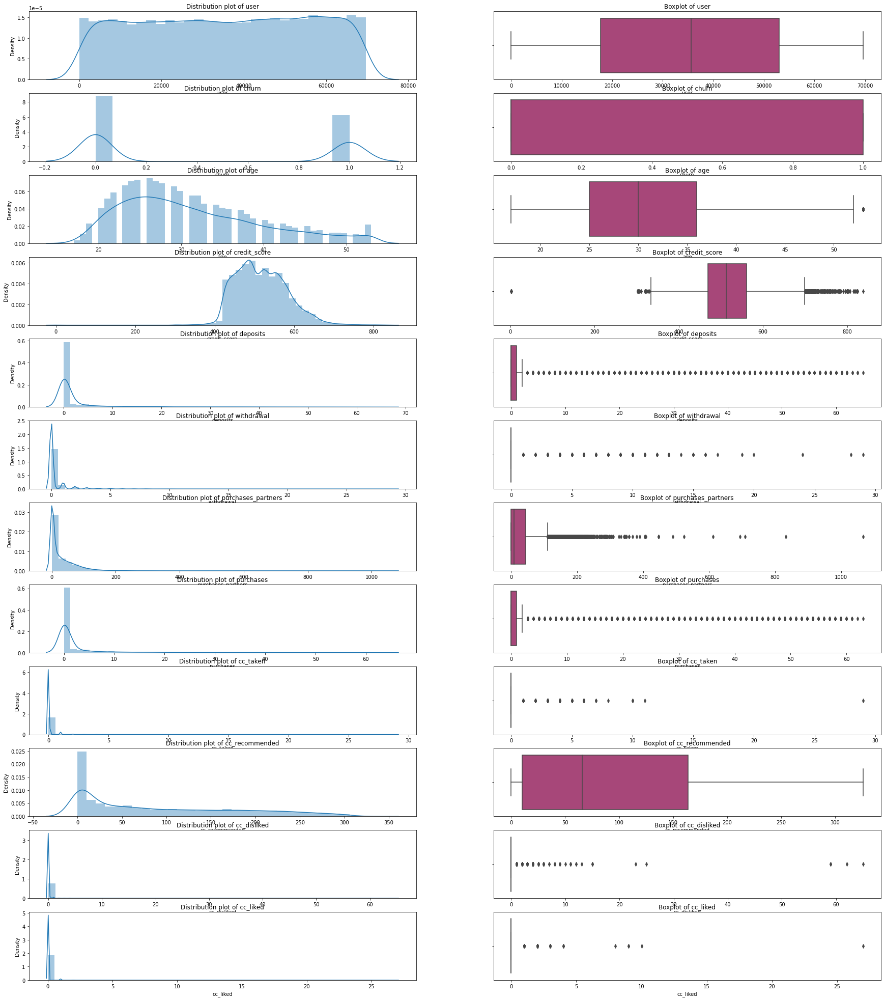

In [119]:
def plot_box(x,fig):
    plt.subplot(12,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(12,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

Barring `Rewards Earned` and `Age` rest all of the Features contain Outliers.

## Outlier Treatment for Application Begin

In [120]:
q3 = churn['cc_application_begin'].quantile(0.75)
q1 = churn['cc_application_begin'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['cc_application_begin'] > uf]
uc = churn['cc_application_begin'].quantile(0.99)

for i in churn.index:
    if churn.loc[i,'cc_application_begin'] > uf:
        churn.loc[i,'cc_application_begin'] = uc


In [121]:
outliers.shape

(1602, 30)

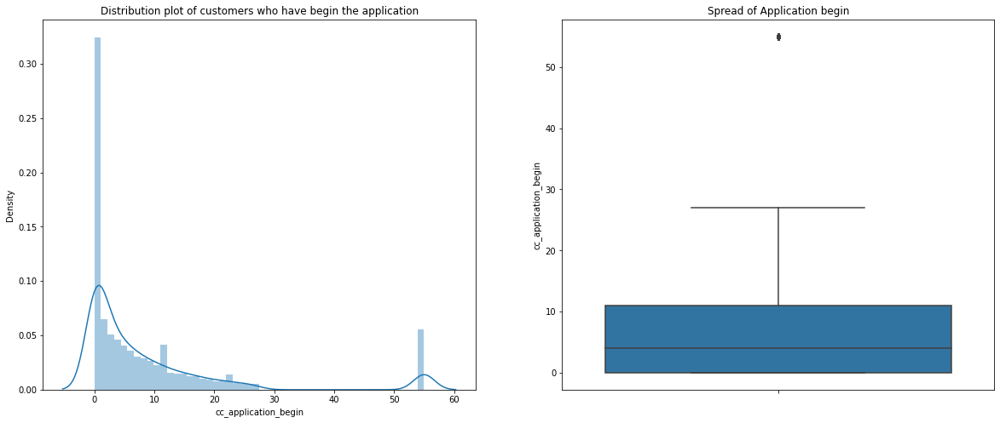

In [122]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have begin the application')
sns.distplot(churn.cc_application_begin)

plt.subplot(1,2,2)
plt.title('Spread of Application begin')
sns.boxplot(y=churn.cc_application_begin)

plt.show()

In [123]:
q3 = churn['cc_application_begin'].quantile(0.75)
q1 = churn['cc_application_begin'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['cc_application_begin'] > uf]
outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
11,25899,0,41.0,O,625.0,14,0,116,13,0,217,0,0,55.0,1,1,1,1,0,0,Semi-Monthly,0,0,0,0,0,0,65.0,2.17,0
34,42910,0,45.0,R,610.0,48,0,76,48,0,204,0,0,55.0,1,1,1,0,1,0,Weekly,0,0,0,0,0,0,58.0,1.93,1
75,42253,0,30.0,R,595.0,13,0,89,12,0,257,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,65.0,2.17,0
92,36751,0,39.0,R,529.0,24,1,69,24,0,218,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,56.0,1.87,1
121,41826,1,22.0,R,440.0,9,2,107,9,0,170,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,39.0,1.30,1
130,39733,1,29.0,R,491.0,0,0,0,0,0,177,1,0,55.0,1,0,0,0,1,0,Weekly,0,0,0,0,0,0,51.0,1.70,0
137,35351,0,35.0,R,528.0,15,0,3,15,1,300,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,65.0,2.17,0
143,45320,0,40.0,O,453.0,8,0,52,8,0,294,0,0,55.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,1,0,67.0,2.23,0
178,46856,0,22.0,R,652.0,6,1,198,6,0,301,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,1,0,65.0,2.17,0
212,3148,0,24.0,R,654.0,6,0,163,6,0,290,0,0,55.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,1,0,67.0,2.23,0


In [124]:
outliers.shape

(1602, 30)

Even after converting the outliers to 99 Percentile, we are not able to remove the outliers, from the distribution plot we can see that the outliers are way to extreme. It's best to drop these outliers.

In [125]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [126]:
churn.shape

(24559, 30)

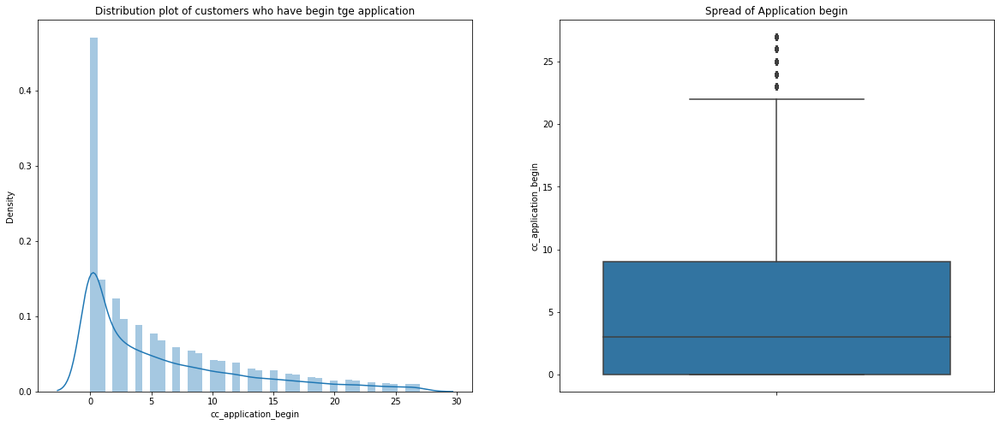

In [127]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have begin tge application')
sns.distplot(churn.cc_application_begin)

plt.subplot(1,2,2)
plt.title('Spread of Application begin')
sns.boxplot(y=churn.cc_application_begin)

plt.show()

Even after dropping the outliers, there are still some outliers left, but the range of outliers is very less, so its better to convert these outliers into 99 Pecentile or 95 Percentile.

In [128]:
q3 = churn['cc_application_begin'].quantile(0.75)
q1 = churn['cc_application_begin'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['cc_application_begin'] > uf]
outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,26.0,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,0,0,33.0,1.10,1
81,1011,0,46.0,R,494.0,7,2,57,7,0,168,0,0,24.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,1,0,33.0,1.10,0
82,38492,0,34.0,R,490.0,0,0,0,0,1,222,9,0,24.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,0,0,63.0,2.10,0
149,3801,0,42.0,R,512.0,2,0,47,2,0,280,0,0,24.0,1,1,1,1,0,2,Bi-Weekly,0,0,0,0,1,0,56.0,1.87,1
176,32820,1,39.0,R,522.0,12,1,8,12,2,147,65,0,24.0,1,1,1,1,0,0,Weekly,0,0,0,0,0,0,44.0,1.47,1
202,10006,0,27.0,R,399.0,10,1,93,10,0,154,0,0,24.0,1,1,1,0,1,0,Weekly,0,0,0,0,0,0,34.0,1.13,1
231,6399,0,45.0,R,429.0,0,0,0,0,0,191,0,0,25.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,59.0,1.97,0
238,47074,1,36.0,R,657.0,60,4,120,60,0,291,0,0,27.0,1,1,1,0,1,0,Monthly,0,0,0,0,1,0,67.0,2.23,1
317,11596,1,45.0,O,527.0,25,2,87,24,0,238,0,0,25.0,1,0,0,1,0,0,Bi-Weekly,0,0,0,0,0,0,60.0,2.00,1
355,10879,1,37.0,R,603.0,22,1,19,22,0,151,0,0,25.0,1,1,1,0,1,2,Weekly,0,0,0,0,0,0,44.0,1.47,1


In [129]:
outliers.shape

(811, 30)

In [130]:
churn['cc_application_begin'].quantile(0.95)

21.0

In [131]:
churn['cc_application_begin'].quantile(0.99)

26.0

In [132]:
uc = churn['cc_application_begin'].quantile(0.95)

for i in churn.index:
    if churn.loc[i,'cc_application_begin'] > uf:
        churn.loc[i,'cc_application_begin'] = uc

In [133]:
churn.shape

(24559, 30)

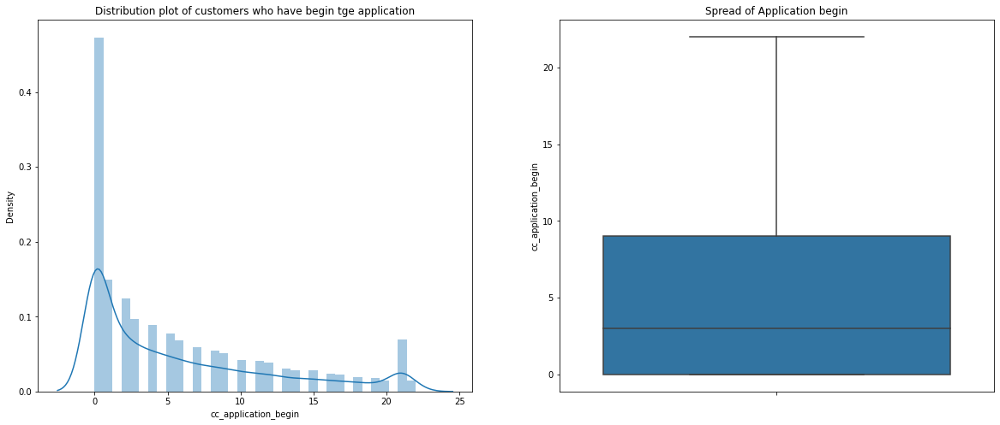

In [134]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have begin tge application')
sns.distplot(churn.cc_application_begin)

plt.subplot(1,2,2)
plt.title('Spread of Application begin')
sns.boxplot(y=churn.cc_application_begin)

plt.show()

Now there are no outliers in CC_Application_Begin. We converted into 95 Percentile because most or all of the outliers were in the range 21 to 26.

ValueError: ignored

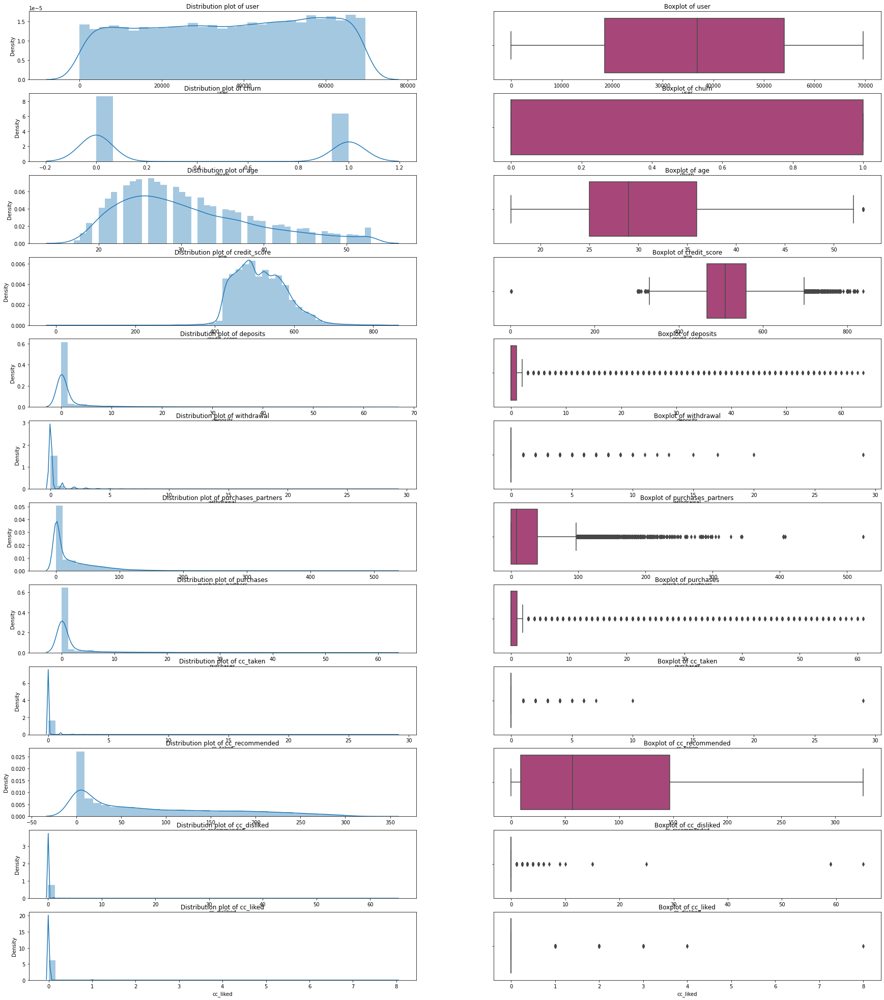

In [135]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

## Outlier Treatment of cc_liked,cc_disliked and cc_taken

In [136]:
churn['cc_liked'].value_counts()

0    24390
1      137
2       20
3        9
4        2
8        1
Name: cc_liked, dtype: int64

There are hardly any people with cc_liked > 1, its best to drop these rows.

In [137]:
outliers = churn[churn['cc_liked'] > 1]
outliers.shape

(32, 30)

In [138]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [139]:
churn['cc_liked'].value_counts()

0    24390
1      137
Name: cc_liked, dtype: int64

ValueError: ignored

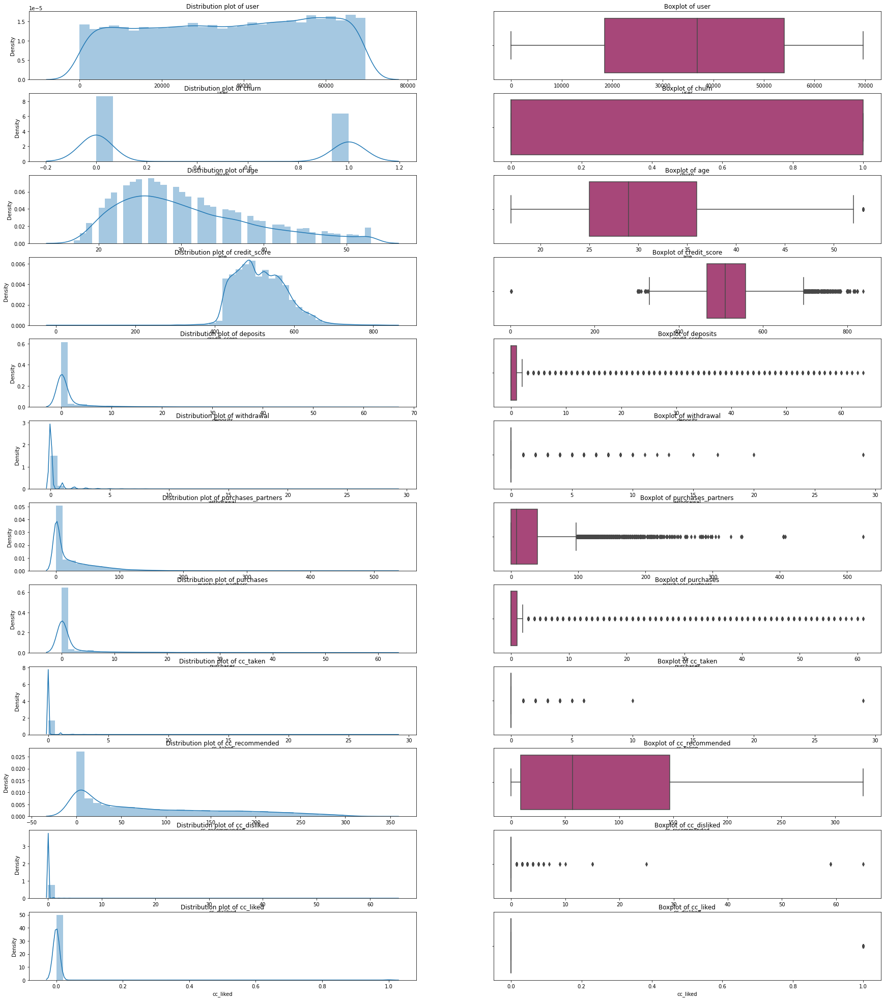

In [140]:
def plot_box(x,fig):
    plt.subplot(12,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(12,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

In [142]:
churn['cc_disliked'].value_counts()

0     24149
1       264
2        45
4        23
3        23
5         7
6         6
15        2
59        2
9         2
10        1
25        1
7         1
65        1
Name: cc_disliked, dtype: int64

There are hardly any user who have disliked 2 or More Credit Cards, its best to drop them.

In [141]:
outliers = churn[churn['cc_disliked'] > 1]
outliers.shape

(114, 30)

In [143]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [144]:
churn['cc_disliked'].value_counts()

0    24149
1      264
Name: cc_disliked, dtype: int64

ValueError: ignored

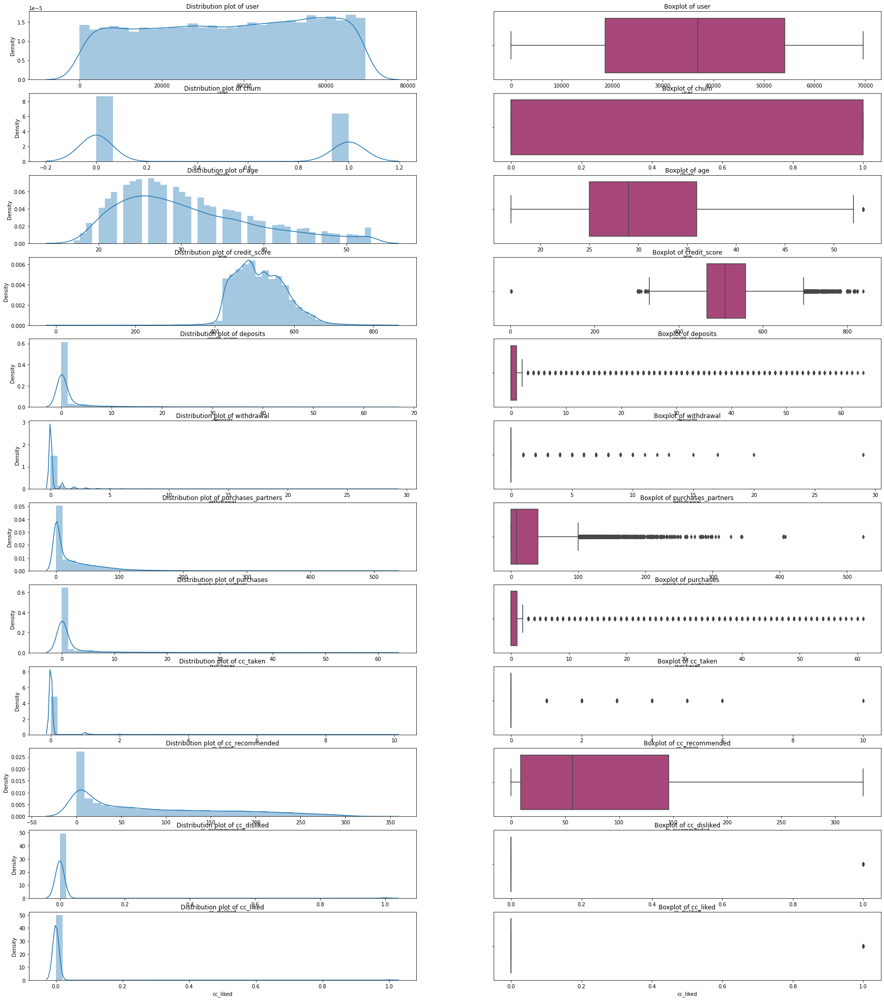

In [145]:
def plot_box(x,fig):
    plt.subplot(12,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(12,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

In [146]:
churn['cc_taken'].value_counts()

0     23478
1       723
2       139
3        36
4        26
5         6
6         4
10        1
Name: cc_taken, dtype: int64

Again there are hardly any users taking more than 1 credit card, it is better to drop them.

In [147]:
outliers = churn[churn['cc_taken'] > 1]
outliers.shape

(212, 30)

In [148]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [149]:
churn['cc_taken'].value_counts()

0    23478
1      723
Name: cc_taken, dtype: int64

ValueError: ignored

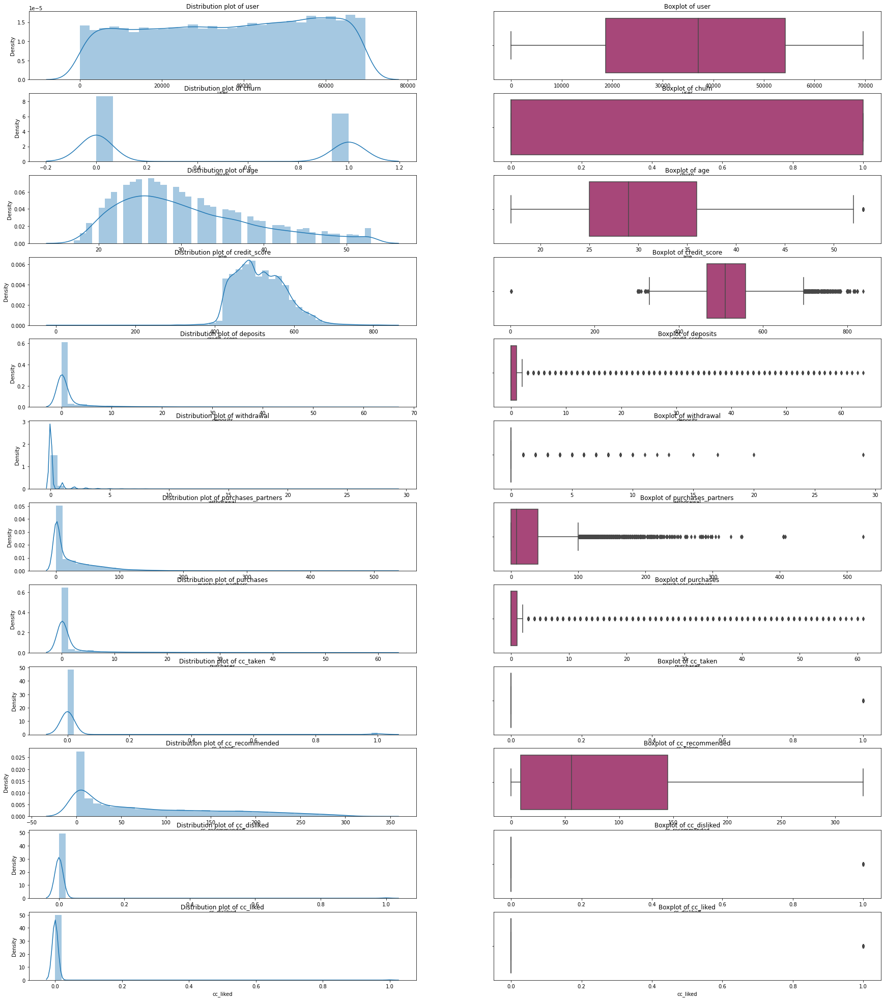

In [150]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

In [151]:
churn.shape

(24201, 30)

## Exploring purchases

In [152]:
churn['purchases'].quantile(0.95)

16.0

In [153]:
churn['purchases'].quantile(0.97)

24.0

In [154]:
churn['purchases'].quantile(0.98)

31.0

In [155]:
churn['purchases'].quantile(0.99)

40.0

In [156]:
churn['purchases'].value_counts()

0     16806
1      2210
2       977
3       621
4       405
5       363
6       289
7       234
8       181
9       163
10      157
11      141
13      110
12      103
14      101
15       93
18       89
17       87
16       73
19       67
20       58
25       48
22       48
24       45
27       45
28       42
21       35
23       33
26       33
38       31
30       30
34       29
29       29
37       28
32       26
36       25
31       25
39       23
33       22
35       19
49       19
41       19
42       19
47       18
45       18
44       18
50       16
51       16
40       16
55       15
53       13
43       10
54        9
56        9
48        9
46        9
52        8
57        5
60        5
58        3
61        2
59        1
Name: purchases, dtype: int64

In [157]:
churn6 = churn.copy()

In [158]:
q3 = churn6['purchases'].quantile(0.75)
q1 = churn6['purchases'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn6[churn6['purchases'] > uf]
outliers

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
2,58313,0,35.0,R,561.0,47,2,86,47,0,285,0,0,9.0,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,74,0,0,21.0,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,0,0,33.0,1.10,1
5,3120,1,32.0,R,567.0,5,3,111,5,0,227,0,0,17.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,55.0,1.83,0
14,24387,0,47.0,R,495.0,11,1,20,11,0,30,0,0,10.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,0,0,11.0,0.69,1
16,30419,1,24.0,R,479.0,6,2,24,6,0,55,0,0,4.0,1,0,0,0,1,0,Weekly,0,0,0,0,0,0,27.0,0.90,0
17,30693,0,31.0,R,565.0,17,2,62,17,0,180,0,0,22.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,43.0,1.43,0
23,13813,1,30.0,R,505.0,6,0,11,6,0,20,0,0,3.0,1,0,0,0,1,2,Bi-Weekly,0,0,0,0,0,0,12.0,0.40,0
47,46400,1,38.0,R,519.0,12,2,79,12,0,105,0,0,12.0,1,1,1,1,0,4,Bi-Weekly,0,0,0,0,0,0,37.0,1.23,1
51,40595,1,24.0,R,529.0,3,0,56,3,0,93,0,0,8.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,0,0,25.0,0.83,0
58,1826,1,48.0,O,507.0,33,0,16,31,0,185,0,0,14.0,1,1,1,1,0,2,Bi-Weekly,0,0,0,0,0,0,47.0,1.57,0


In [159]:
outliers.shape

(4208, 30)

In [160]:
outliers1 = churn6[churn6['purchases'] > 5]
outliers1.shape

(2819, 30)

In [161]:
for i in outliers1.index:
    churn6.drop(i,inplace = True)

In [162]:
churn6['purchases'].value_counts()

0    16806
1     2210
2      977
3      621
4      405
5      363
Name: purchases, dtype: int64

We can see purchases more than 5 are considered as outlier, and it is not right to convert purchases greater than 10 to 1 Purchase or 0 Purchase, it might affect our analysis. Its better to drop outliers greater than 5. If we drop values greater than 1, we would be losing about 2000 observations, which could be lot of loss of data.

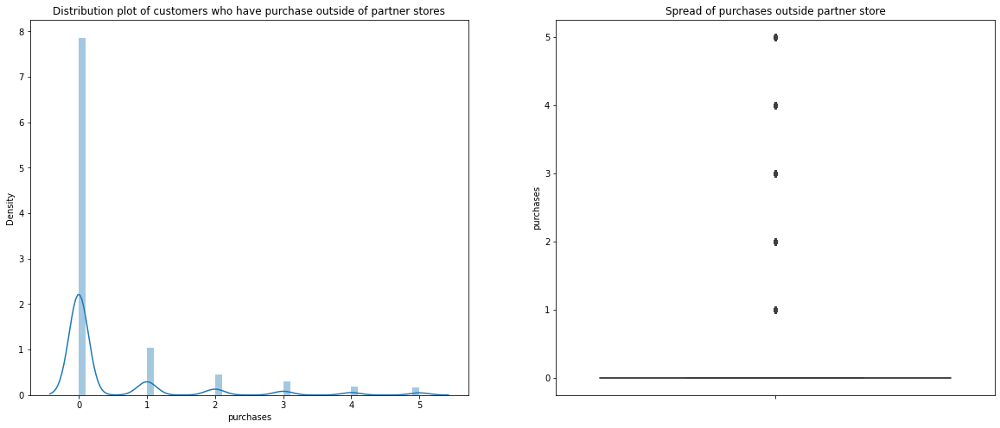

In [163]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of customers who have purchase outside of partner stores')
sns.distplot(churn6.purchases)

plt.subplot(1,2,2)
plt.title('Spread of purchases outside partner store')
sns.boxplot(y=churn6.purchases)

plt.show()

In [164]:
churn6.shape

(21382, 30)

In [165]:
churn.drop(columns = 'purchases',inplace = True)

Almost 90 % of observations have purchases 0, so its better to drop the feature purchases.

In [166]:
churn.columns

Index(['user', 'churn', 'age', 'housing', 'credit_score', 'deposits',
       'withdrawal', 'purchases_partners', 'cc_taken', 'cc_recommended',
       'cc_disliked', 'cc_liked', 'cc_application_begin', 'app_downloaded',
       'web_user', 'app_web_user', 'ios_user', 'android_user',
       'registered_phones', 'payment_type', 'waiting_4_loan', 'cancelled_loan',
       'received_loan', 'rejected_loan', 'left_for_two_month_plus',
       'left_for_one_month', 'rewards_earned', 'reward_rate', 'is_referred'],
      dtype='object')

ValueError: ignored

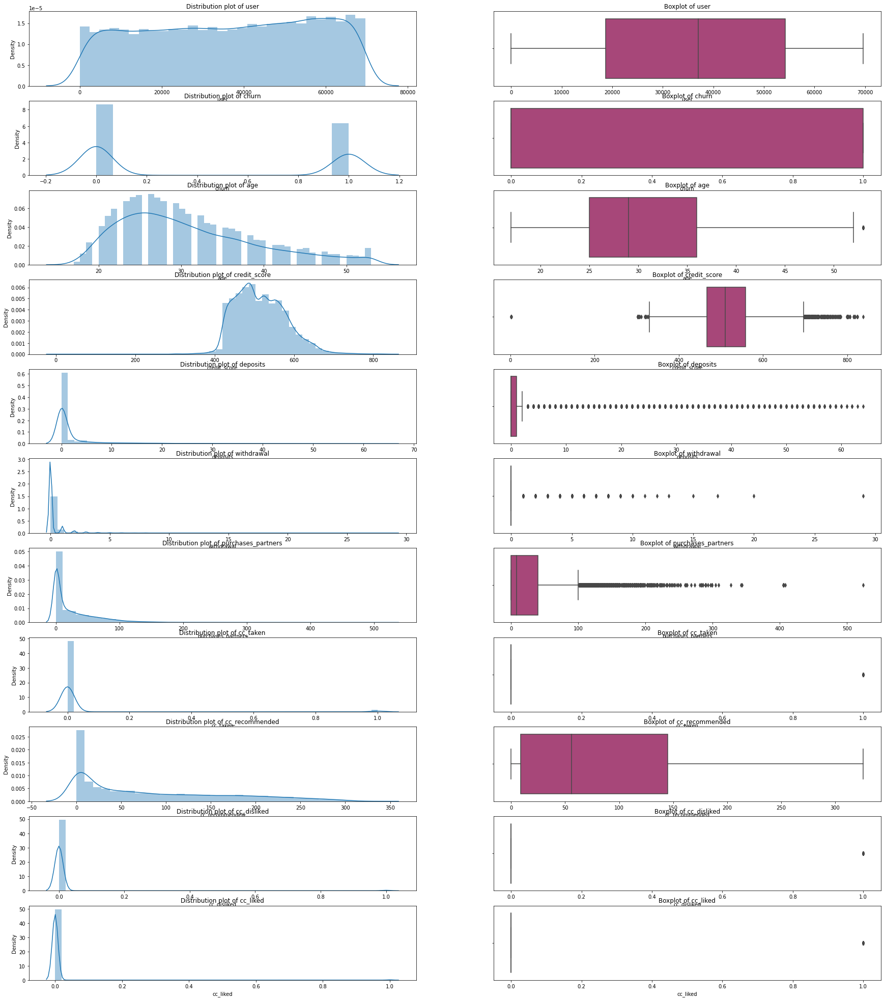

In [167]:
num_cols.drop(columns = 'purchases',inplace = True)
def plot_box(x,fig):
    plt.subplot(11,2,fig)
    #plt.figure(figsize = (15,20))
    plt.title('Distribution plot of '+x)
    sns.distplot(churn[x])
    plt.subplot(11,2,(fig+1))
    plt.title('Boxplot of '+x)
    sns.boxplot(churn[x], palette=("magma"))
    
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

## Outlier Treatment for purchase partners

In [168]:
churn['purchases_partners'].value_counts()

0      7528
1      1057
2       781
3       705
4       538
5       486
6       375
7       371
9       301
8       288
10      274
11      271
12      265
14      242
16      233
15      225
17      217
13      217
19      214
23      208
27      205
21      198
26      193
24      193
18      189
22      187
20      186
30      174
29      174
25      170
31      163
40      160
28      154
39      153
34      152
32      148
45      145
37      143
41      136
46      134
35      132
36      132
33      131
42      125
38      125
55      124
44      119
56      115
47      115
49      109
50      109
48      107
54      106
52      103
59      103
43      103
63      101
51      101
57       98
62       95
65       95
61       94
60       93
58       91
76       91
68       89
67       86
53       85
66       85
69       84
80       78
71       76
72       76
74       76
79       73
73       71
77       70
70       68
81       68
64       67
75       67
87       66
91       62
82  

In [169]:
outliers = churn[churn['purchases_partners'] > 90]
outliers.shape

(1591, 29)

In [170]:
for i in outliers.index:
    churn.drop(i,inplace = True)

In [171]:
churn.shape

(22610, 29)

ValueError: ignored

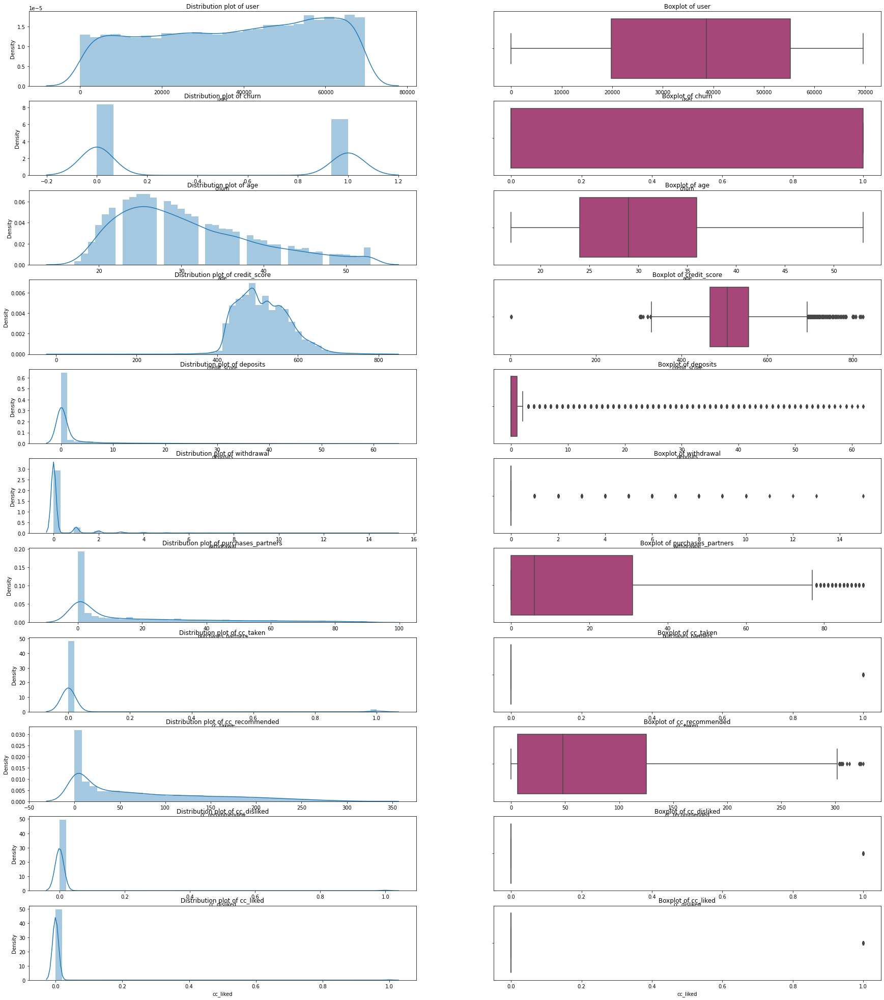

In [172]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

## Outlier treatment for withdrawals

In [173]:
churn['withdrawal'].value_counts()

0     19811
1      1662
2       591
3       273
4       125
5        61
6        37
7        18
8        16
9         7
10        5
15        1
13        1
12        1
11        1
Name: withdrawal, dtype: int64

As most of the users have 0 or 1 withdrawal, we shall convert all withdrawals greater than 1 to 1, now we can classify our feature as whether the user has withdrawan money or not.



In [174]:
for i in churn.index:
    if churn.loc[i,'withdrawal'] > 1:
        churn.loc[i,'withdrawal'] = 1

In [175]:
churn['withdrawal'].value_counts()

0    19811
1     2799
Name: withdrawal, dtype: int64

In [176]:
churn.shape

(22610, 29)

ValueError: ignored

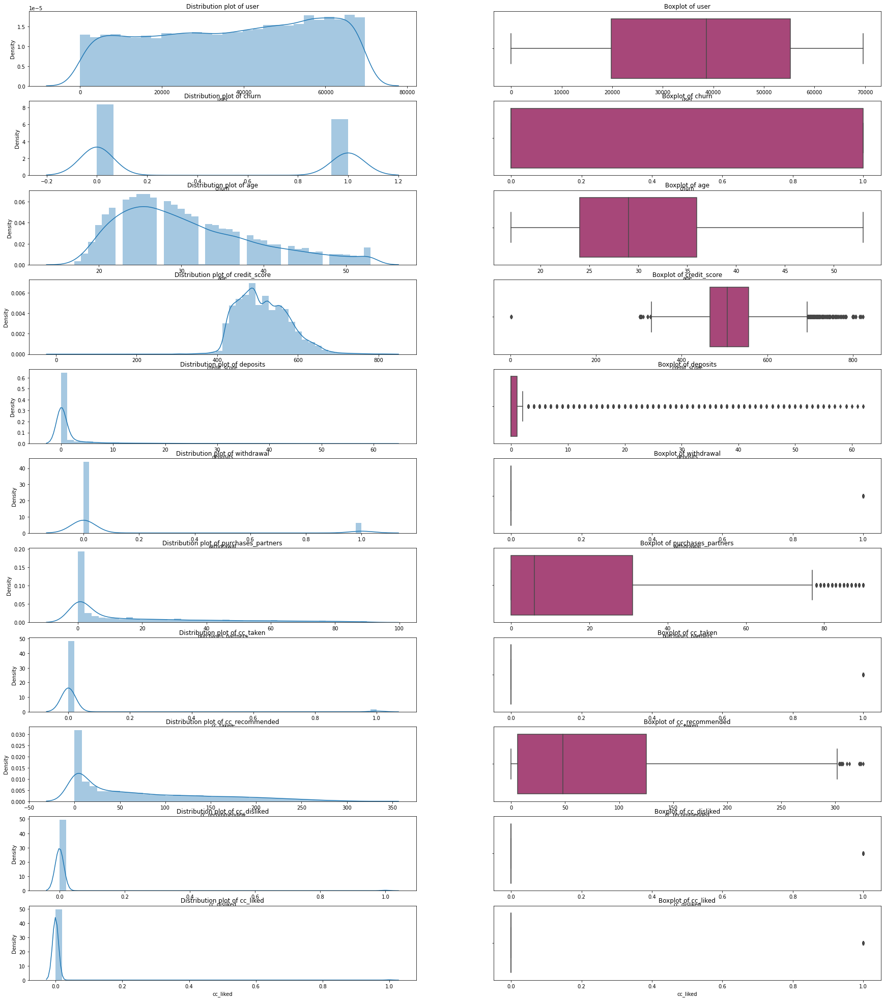

In [177]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

## Outlier Treatment for Number of Deposits

In [178]:
churn['deposits'].value_counts()

0     16084
1      2045
2       874
3       543
4       360
5       315
6       255
7       207
8       155
11      128
9       128
10      125
12       92
14       87
13       87
15       78
17       75
16       70
18       70
19       68
20       58
24       37
27       36
28       34
22       33
25       33
26       31
21       28
31       28
29       25
41       24
23       24
38       23
30       22
36       22
39       21
37       21
34       20
33       19
32       19
35       18
52       17
40       16
44       15
54       14
42       12
48       11
46       11
49       10
43       10
50       10
45        9
55        8
51        7
47        7
53        6
57        6
59        6
56        5
62        3
60        2
61        2
58        1
Name: deposits, dtype: int64

In [179]:
churn['deposits'].quantile(0.99)

39.0

In [180]:
q3 = churn['deposits'].quantile(0.75)
q1 = churn['deposits'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
uf
outliers = churn[churn['deposits'] > uf]
outliers['deposits'].describe()

count    3607.000000
mean       13.297754
std        12.358508
min         3.000000
25%         4.000000
50%         8.000000
75%        17.500000
max        62.000000
Name: deposits, dtype: float64

Its not right to convert to 99 percentile as people with only 3 deposits will be converted to 39 deposits, similar to withdrawals we could convert all deposits greater than 1 to 1 and classify our feature as whether the user has done deposit or not.

In [181]:
for i in churn.index:
    if churn.loc[i,'deposits'] > 1:
        churn.loc[i,'deposits'] = 1

In [182]:
churn['deposits'].value_counts()

0    16084
1     6526
Name: deposits, dtype: int64

In [183]:
churn.shape

(22610, 29)

ValueError: ignored

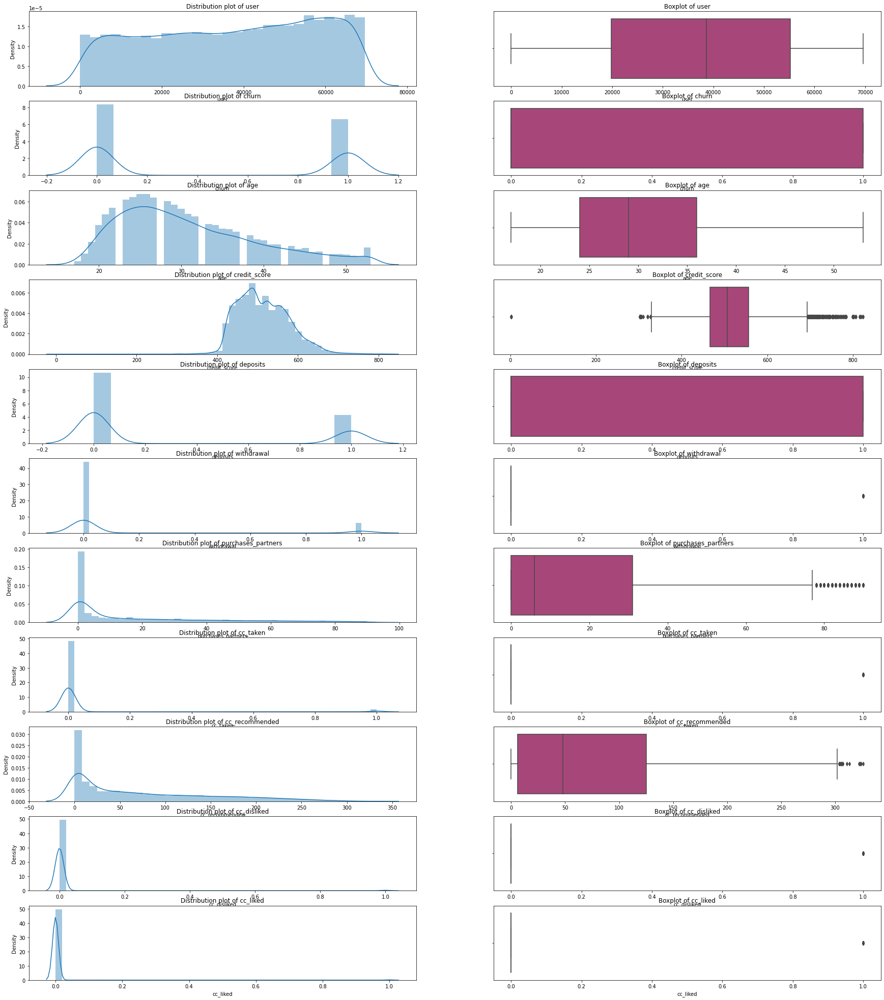

In [184]:
plt.figure(figsize=(30,35))

n = 1
for i in num_cols:
    plot_box(i,n)
    n = n + 2

## Outlier Treatment for Credit Score

In [185]:
churn['credit_score'].describe()

count    22610.000000
mean       514.327952
std         63.758261
min          2.000000
25%        466.000000
50%        507.000000
75%        557.000000
max        824.000000
Name: credit_score, dtype: float64

In [186]:
q3 = churn['credit_score'].quantile(0.75)
q1 = churn['credit_score'].quantile(0.25)
iqr = q3-q1
uf = q3+1.5*iqr
lf = q1 - 1.5*iqr

uc = churn['credit_score'].quantile(0.99)
lc = churn['credit_score'].quantile(0.01)
print(lc,uc)

408.0 679.0


In [187]:
for i in churn.index:
    if churn.loc[i,'credit_score'] > uf:
        churn.loc[i,'credit_score'] = uc
    if churn.loc[i,'credit_score'] < lf:
        churn.loc[i,'credit_score'] = lc

In [188]:
churn['credit_score'].describe()

count    22610.000000
mean       514.059310
std         62.028321
min        330.000000
25%        466.000000
50%        507.000000
75%        557.000000
max        693.000000
Name: credit_score, dtype: float64

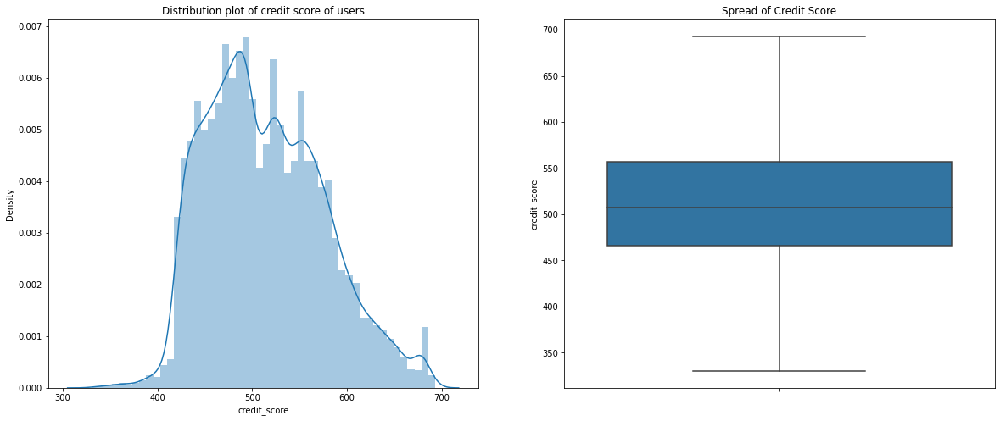

In [189]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Distribution plot of credit score of users')
sns.distplot(churn.credit_score)

plt.subplot(1,2,2)
plt.title('Spread of Credit Score')
sns.boxplot(y=churn.credit_score)

plt.show()

Now we are done with Outlier treatment for all the columns.

--------------------------------

# Encoding Categorical Variables

In [190]:
cat_cols = churn.select_dtypes(include = 'object')
cat_cols.head()

,housing,payment_type
0,R,Bi-Weekly
1,R,Weekly
2,R,Semi-Monthly
3,R,Bi-Weekly
4,R,Bi-Weekly


In [191]:
churn['housing'].value_counts()

R    18925
O     3685
Name: housing, dtype: int64

In [192]:
ma = {"R":1,"O":0}
churn['housing'].replace(ma,inplace = True)

In [193]:
churn['housing'].value_counts()

1    18925
0     3685
Name: housing, dtype: int64

In [194]:
churn['payment_type'].value_counts()

Bi-Weekly       13997
Weekly           4454
Semi-Monthly     2094
Monthly          2065
Name: payment_type, dtype: int64

In [195]:
pt = pd.get_dummies(churn['payment_type'],drop_first = True)

In [196]:
churn = pd.concat([churn,pt],axis = 1)
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,payment_type,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,1,0,0,Bi-Weekly,0,0,0,0,1,0,6.0,0.00,0,0,0,0
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,1,0,0,Weekly,0,0,0,0,0,0,44.0,1.47,1,0,0,1
2,58313,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,0,1,2,Semi-Monthly,0,0,0,0,1,0,65.0,2.17,0,0,1,0
3,8095,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,1,0,Bi-Weekly,0,0,0,0,0,0,33.0,1.10,1,0,0,0
4,61353,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,1,0,Bi-Weekly,0,0,0,0,1,0,1.0,0.03,0,0,0,0


In [197]:
churn.drop(columns = 'payment_type',inplace = True)
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,ios_user,android_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,1,0,0,0,0,0,0,1,0,6.0,0.00,0,0,0,0
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,1,0,0,0,0,0,0,0,0,44.0,1.47,1,0,0,1
2,58313,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,0,1,2,0,0,0,0,1,0,65.0,2.17,0,0,1,0
3,8095,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,1,0,0,0,0,0,0,0,33.0,1.10,1,0,0,0
4,61353,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,1,0,0,0,0,0,1,0,1.0,0.03,0,0,0,0


## Combining Android User and IOS User

In [198]:
churn['user_type'] = list(map(lambda x: x==1,churn['ios_user']))
# user_type 1 = ios_user 2 = Android_user
ma = {True:1,False:2}
churn['user_type'].replace(ma,inplace = True)
churn.drop(columns = ['ios_user','android_user'],inplace = True)

In [199]:
churn.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_downloaded,web_user,app_web_user,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,user_type
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,1,0,0,0,0,0,1,0,6.0,0.00,0,0,0,0,1
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,1,0,0,0,0,0,0,0,44.0,1.47,1,0,0,1,1
2,58313,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,1,0,0,2,0,0,0,0,1,0,65.0,2.17,0,0,1,0,2
3,8095,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,1,0,0,0,0,0,0,0,0,0,33.0,1.10,1,0,0,0,2
4,61353,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,1,0,0,0,0,0,1,0,1.0,0.03,0,0,0,0,2


In [200]:
churn['app_downloaded'].value_counts(normalize = True)

1    0.948651
0    0.051349
Name: app_downloaded, dtype: float64

In [201]:
churn.drop(columns = 'app_downloaded',inplace = True)

We have decided to drop feature App-Downloaded because neither it is creating value to our analysis nor helping us in any way. It is dominated by only 1 value.

## Statistical Analysis

In [202]:
pd.crosstab(churn['churn'],churn['rejected_loan'])

rejected_loan,0,1
churn,,
0,12597,19
1,9894,100


- **Ho : Proportion of not rejected loan churning = proportion of rejected loan churning.**

- **H1 : Proportion of not rejected loan churning != proportion of rejected loan churning.**

In [203]:
from statsmodels.stats.proportion import proportions_ztest
proportions_ztest([9894,100],[22491,119])

(-8.772448130281658, 1.748230567613988e-18)

 **As p_value < 0.05,we reject null hypothesis, therefore Proportion of not rejected loan churning != proportion of rejected loan churning, hence rejected_loan has an impact on whether a user will churn or not.**

In [204]:
pd.crosstab(churn['churn'],churn['is_referred'])

is_referred,0,1
churn,,
0,8724,3892
1,7479,2515


- **Ho : Proportion of users not referred churning = proportion of users  referred churning.**
- **H1 : Proportion of users not referred churning != proportion of users  referred churning.**

In [205]:
proportions_ztest([7479,2515],[16203,6407])

(9.420128294347283, 4.505371919269915e-21)

- **As p_value < 0.05,we reject null hypothesis, therefore ,Proportion of users not referred churning != proportion of users referred churning hence is_referred has an impact on whether a user will churn or not.**

In [206]:
churn.drop(columns = 'registered_phones',inplace = True)

In [207]:
churn.head(2)

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,web_user,app_web_user,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,user_type
0,55409,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,1,0,6.0,0.00,0,0,0,0,1
1,23547,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,0,0,0,0,0,0,44.0,1.47,1,0,0,1,1


In [208]:
churn.groupby('cc_taken')[['credit_score']].mean()

,credit_score
cc_taken,
0,513.437566
1,532.881051


- We observe that People who haven't taken any credit card have a low credit score this make sense as there is very low chance of a person actually getting a credit card with a low credit score.

In [209]:
churn.groupby('cc_recommended')[['credit_score']].mean()

,credit_score
cc_recommended,
0,486.331079
1,491.322115
2,498.924779
3,497.936275
4,498.015209
5,497.758904
6,508.051829
7,502.460526
8,503.025316


- We observe that more number of credit cards are recommended to people/users with higher credit score, and less number of credit cards are recommended to people with comparitively lower credit score. This make sense,as a company would not take a risk to provide more number of credit cards to a person who is more likely to default(because of low cred score).

In [210]:
pd.crosstab(churn['churn'],churn['cc_disliked'])

cc_disliked,0,1
churn,,
0,12533,83
1,9853,141


- **H0 : Proprtion who users who did not dislike credit card churning = proprtion of users who disliked credit card churning.**
- **H1 : Proprtion who users who did not dislike credit card churning != proprtion of users who disliked credit card churning.**

In [211]:
proportions_ztest([9853,141],[22386,224])

(-5.677219609305569, 1.3690166927730599e-08)

- We observe that p_value < 0.05,therefore we rejrct null hypothesis, hence  Proprtion who users who did not dislike credit card churning != proprtion of users who disliked credit card churning. Therefore cc_disliked is important for our analysis to find if a user will churn or not.

In [212]:
churn['user_type'].value_counts()

2    14037
1     8573
Name: user_type, dtype: int64

In [213]:
pd.crosstab(churn['user_type'],churn['left_for_two_month_plus'])

left_for_two_month_plus,0,1
user_type,,
1,7319,1254
2,11480,2557


In [214]:
1254/8573,2557/14037

(0.14627318324973754, 0.18216143050509367)

In [215]:
pd.crosstab(churn['user_type'],churn['is_referred'])

is_referred,0,1
user_type,,
1,5774,2799
2,10429,3608


In [216]:
2799/8573,3608/14037

(0.3264901434736965, 0.2570349789841134)

- We observe that a larger proportion of Android users have left our subscription for more than two months, and less proportion of android users have been referred about us. This might be because our android app might not be performing well, or it might be not be user friendly or there might be lot of technical glitches involved. We could use this analysis to improve the performane of our android app.

In [217]:
churn.groupby('churn')[['purchases_partners']].mean()

,purchases_partners
churn,
0,24.464569
1,11.415149


- We observe that people having higher number of purchases from partner stores are less likely to churn as compared to ones who make less purchases from our partner stores. This shows a good sign, also talks about the company's potential.
- We believe that if we can target the users who are making less number of purchases from our partner stores we can considerably reduce the number of users who churn, this could be premium features, we could also provide cash back benefits on timely payments of credit_card_bills.

- We could provide subscribtion benefits to Amazon Prime, Hotstar, Netflix and other common channels if users use our services.
- This might also increase our new customer base.

In [218]:
pd.crosstab(churn['churn'],churn['received_loan'])

received_loan,0,1
churn,,
0,12462,154
1,9751,243


In [219]:
154/12616,243/9994

(0.012206721623335448, 0.024314588753251952)

- We observe that proportion of people receiving loan are more likely to churn. This is bad sign for us. There might be some gap in the services provided. We can improve our customer base and services by including the above mentioned features.

In [220]:
pd.crosstab(churn['churn'],churn['web_user'])

web_user,0,1
churn,,
0,5647,6969
1,3929,6065


In [221]:
6969/12616,6065/9994

(0.5523937856689918, 0.6068641184710827)

- The Proportion of users are more likely to churn than not churn, this is also a sign of concern for us. We have to come with some strategies so that our web_user_base have a great experience navigating through our website and reap the best out of our features.

- We also observe that most people using our web_service have also downloaded the app, this might be because of signs of unhappiness while using our web_platform.

## Checking for Multicollinearity

In [222]:
user = churn['user']
user.head()

0    55409
1    23547
2    58313
3     8095
4    61353
Name: user, dtype: int64

In [223]:
churn.drop(columns = 'user',inplace = True)

In [224]:
churn.corr()

,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,web_user,app_web_user,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,user_type
churn,1.000000,-0.058758,0.019972,-0.063948,-0.123741,-0.075228,-0.268287,0.062980,-0.141466,0.037756,0.023807,-0.084999,0.054747,0.031801,-0.017763,0.042419,0.045782,0.058341,0.013911,0.038769,-0.122808,-0.113255,-0.062648,0.000073,-0.015232,0.044169,-0.019198
age,-0.058758,1.000000,-0.057444,0.023305,-0.004441,0.015134,-0.002493,0.037724,0.109192,-0.007177,0.003299,0.116106,0.206030,0.160359,0.004722,-0.014777,0.002286,0.012055,-0.028499,0.024720,0.108783,0.101056,0.000468,0.062427,0.007440,-0.043549,-0.168559
housing,0.019972,-0.057444,1.000000,-0.032189,0.012847,0.005884,0.008703,-0.004196,-0.010796,0.004241,-0.011393,0.001895,-0.009865,-0.006573,-0.010232,-0.011537,-0.020328,0.000653,-0.006359,-0.010111,-0.011618,-0.011419,0.028225,-0.015980,-0.007732,-0.004541,-0.011658
credit_score,-0.063948,0.023305,-0.032189,1.000000,0.099286,0.071143,0.144330,0.055151,0.259105,0.036363,0.030345,0.236519,0.045141,0.088551,0.000357,0.031744,0.081639,0.002158,0.008762,0.021247,0.256791,0.258446,0.063304,0.002147,0.027809,-0.000043,0.003870
deposits,-0.123741,-0.004441,0.012847,0.099286,1.000000,0.590095,0.430831,-0.079157,0.207135,-0.046964,-0.021033,0.339840,0.018954,0.079603,0.006277,-0.000753,-0.027933,-0.027448,0.025035,-0.034554,0.110721,0.145150,0.287150,-0.002042,-0.000471,0.002068,-0.053422
withdrawal,-0.075228,0.015134,0.005884,0.071143,0.590095,1.000000,0.288750,-0.056867,0.137309,-0.029464,-0.019292,0.263308,0.025128,0.060776,0.004745,0.000104,-0.013442,-0.021773,0.024113,-0.017006,0.074026,0.090242,0.217199,0.002034,0.006844,0.001897,-0.040053
purchases_partners,-0.268287,-0.002493,0.008703,0.144330,0.430831,0.288750,1.000000,-0.124627,0.516716,-0.069031,-0.043771,0.407235,0.023066,0.096760,-0.002158,-0.002573,-0.015481,-0.036335,0.082914,-0.042888,0.375017,0.361085,0.296504,-0.018853,0.011991,-0.006036,-0.015083
cc_taken,0.062980,0.037724,-0.004196,0.055151,-0.079157,-0.056867,-0.124627,1.000000,0.136999,0.162032,0.096550,0.142396,0.035212,0.052215,-0.006625,0.004546,0.023552,0.014574,-0.028112,0.048083,0.180328,0.165971,-0.036191,-0.011372,-0.002567,0.010476,-0.036715
cc_recommended,-0.141466,0.109192,-0.010796,0.259105,0.207135,0.137309,0.516716,0.136999,1.000000,0.103833,0.071385,0.663689,0.093970,0.185593,-0.019791,0.003757,0.053867,-0.032914,0.025119,0.036467,0.921357,0.858364,0.174706,-0.035661,0.017007,0.006510,0.005229
cc_disliked,0.037756,-0.007177,0.004241,0.036363,-0.046964,-0.029464,-0.069031,0.162032,0.103833,1.000000,0.053240,0.125455,0.018862,0.028226,-0.003646,-0.003113,0.017228,-0.007276,-0.021181,0.016220,0.129302,0.119582,-0.025245,-0.008461,0.006554,0.007718,0.015586


In [225]:
churn.head()

,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,web_user,app_web_user,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,user_type
0,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,1,0,0,0,0,1,0,6.0,0.00,0,0,0,0,1
1,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,1,0,0,0,0,0,0,44.0,1.47,1,0,0,1,1
2,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,0,0,0,0,0,0,1,0,65.0,2.17,0,0,1,0,2
3,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,0,0,0,0,0,0,0,0,33.0,1.10,1,0,0,0,2
4,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,1,0,0,0,0,1,0,1.0,0.03,0,0,0,0,2


In [226]:
churn9 = churn.copy()

- For doing check of Multicollinearity we shall create a copy of our original dataset.

In [227]:
churn9.drop(columns = 'churn',inplace = True)

In [228]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(churn9.values,i) for i in range(churn9.shape[1])]
vif["Features"] = churn9.columns
vif

,VIF,Features
0,13.551936,age
1,5.735477,housing
2,28.474365,credit_score
3,2.580482,deposits
4,1.774663,withdrawal
5,2.959001,purchases_partners
6,1.153287,cc_taken
7,18.418912,cc_recommended
8,1.071159,cc_disliked
9,1.028137,cc_liked


- Vif of `rewards_earned` is high, this may be because it is mutually exclusive or dependent on `reward_rate`, lets try dropping `rewards_earned` and see if vif of `reward_rate` reduces.

In [229]:
churn9.drop(columns = ['rewards_earned'],inplace = True)

In [230]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(churn9.values,i) for i in range(churn9.shape[1])]
vif["Features"] = churn9.columns
vif

,VIF,Features
0,13.551839,age
1,5.734832,housing
2,28.398145,credit_score
3,2.552727,deposits
4,1.774619,withdrawal
5,2.893014,purchases_partners
6,1.149986,cc_taken
7,10.583313,cc_recommended
8,1.070476,cc_disliked
9,1.028130,cc_liked


- Vif of `web_user` and `app_web_user` this is because they are mutually exclusive events,lets check the results if we drop `web_user`.

In [231]:
churn9.drop(columns = 'web_user',inplace = True)

In [232]:
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(churn9.values,i) for i in range(churn9.shape[1])]
vif["Features"] = churn9.columns
vif

,VIF,Features
0,13.038165,age
1,5.734735,housing
2,28.182878,credit_score
3,2.546894,deposits
4,1.774504,withdrawal
5,2.885982,purchases_partners
6,1.149839,cc_taken
7,10.564656,cc_recommended
8,1.070475,cc_disliked
9,1.028126,cc_liked


- Even though Vif of `credit card recommended` and `age` is slightly high we might not drop as these could be an importsnt features in our analysis.`Age` could tell which age group of people are more likely to churn or not churn. `Credit Card Recommendation ` could tell us why a particular user has been recommended a 'n' number of cedit cards, or are more people are not likely/likely to churn on the basis of number of credit cards recommended. Also although VIF of `Credit Score` is high.
but using domain knowledge we believe credit score is our one of the most important feature. We can figure out how a user
with a particular credit score is behaving so that we can target users within a particular credit score range accordingly.

- So after doing test of Multicollinearity, the columns we shall be dropping are `web_user`and `rewards_earned`.

In [233]:
churn.drop(columns = ['web_user','rewards_earned'],inplace = True)

In [234]:
churn.shape

(22610, 25)

In [235]:
churn.head()

,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_web_user,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,user_type
0,0,37.0,1,457.0,0,0,0,0,0,0,0,0.0,1,0,0,0,0,1,0,0.00,0,0,0,0,1
1,0,28.0,1,486.0,0,0,1,0,96,0,0,5.0,1,0,0,0,0,0,0,1.47,1,0,0,1,1
2,0,35.0,1,561.0,1,1,86,0,285,0,0,9.0,0,0,0,0,0,1,0,2.17,0,0,1,0,2
3,0,26.0,1,567.0,1,1,38,0,74,0,0,21.0,0,0,0,0,0,0,0,1.10,1,0,0,0,2
4,1,27.0,1,432.0,0,0,2,0,0,0,0,0.0,1,0,0,0,0,1,0,0.03,0,0,0,0,2


In [236]:
churn[churn['left_for_one_month']==1].describe()

,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_web_user,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,reward_rate,is_referred,Monthly,Semi-Monthly,Weekly,user_type
count,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000,353.0,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000
mean,0.594901,32.524079,0.807365,524.524079,0.164306,0.079320,10.470255,0.099150,96.070822,0.022663,0.005666,6.719547,0.682720,0.005666,0.031161,0.033994,0.005666,0.215297,1.0,1.044618,0.161473,0.067989,0.079320,0.198300,1.611898
std,0.491608,8.559625,0.394928,63.115246,0.371079,0.270621,21.241973,0.299288,80.190349,0.149038,0.075164,6.445408,0.466078,0.075164,0.174001,0.181472,0.075164,0.411612,0.0,0.789848,0.368489,0.252084,0.270621,0.399286,0.488010
min,0.000000,18.000000,0.000000,335.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,26.000000,1.000000,480.000000,0.000000,0.000000,0.000000,0.000000,21.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.330000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,1.000000,31.000000,1.000000,527.000000,0.000000,0.000000,0.000000,0.000000,78.000000,0.000000,0.000000,5.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.930000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,1.000000,38.000000,1.000000,567.000000,0.000000,0.000000,7.000000,0.000000,166.000000,0.000000,0.000000,11.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.830000,0.000000,0.000000,0.000000,0.000000,2.000000
max,1.000000,53.000000,1.000000,692.000000,1.000000,1.000000,90.000000,1.000000,302.000000,1.000000,1.000000,22.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,3.300000,1.000000,1.000000,1.000000,1.000000,2.000000


--------------------------------------------------------------------

## Feature Selection

### Univariate Selection

- Statistical tests can be used to select features that have the strongest relationship with the output variable.
- The scikit-learn library the SelectKBest class that can be used with a suite of different statistical tests to select a specific number of features.
- Here below we used the chi-squared(chi<sup>2</sup>) statistical test for non-negative features to select 10 features from the churn dataset.

In [237]:
import numpy as np

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

x=churn.drop(columns='churn') # Independent columns
y=churn['churn']              # Target column i.e. Churn 

In [238]:
# Apply SelectKBest class to extract top 15 best features
# Kbest = Information Gained
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(x,y)

In [239]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [240]:
# Concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Specs','Score']                  # Naming the dataframe columns

In [241]:
featureScores

,Specs,Score
0,age,176.265710
1,housing,1.469941
2,credit_score,691.993874
3,deposits,246.277529
4,withdrawal,112.115897
5,purchases_partners,50790.490842
6,cc_taken,86.815066
7,cc_recommended,35630.367659
8,cc_disliked,31.911508
9,cc_liked,12.756717


In [242]:
featureScores.nlargest(15,"Score")

,Specs,Score
5,purchases_partners,50790.490842
7,cc_recommended,35630.367659
10,cc_application_begin,1163.439114
2,credit_score,691.993874
3,deposits,246.277529
18,reward_rate,182.125426
0,age,176.265710
4,withdrawal,112.115897
6,cc_taken,86.815066
15,rejected_loan,76.550815


### Feature Importance

- Getting feature importance of each feature of your dataset by using the feature importance property of the model.
- Feature importance given a score for each feature of data, the higher the score more important or relevant is the feature towards your output variable.
- Feature Importance is an inbuilt class that comes with Tree Based Classifiers, we have been using Extra Tree classifier for extracting the top 10 features for the dataset.

In [243]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt

model = ExtraTreesClassifier()
model.fit(x,y)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

In [244]:
model.feature_importances_

array([0.13769453, 0.01929306, 0.16574502, 0.01346352, 0.00872844,
       0.15502039, 0.00589108, 0.12873468, 0.00265508, 0.00168771,
       0.08435719, 0.01833521, 0.00075271, 0.00575128, 0.00528102,
       0.00320603, 0.01671744, 0.00484235, 0.13481209, 0.01794618,
       0.01378292, 0.01499698, 0.01516871, 0.02513639])

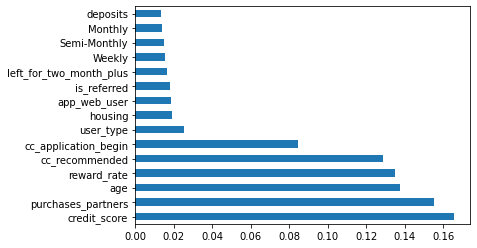

In [245]:
# plot graph of feature importances for better visualization

feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(15).plot(kind="barh")
plt.show()

### Correlation Matrix with Heatmap

- correlation states how the features are related to each other or the target variable.
- Correlation can be positive (increase in one a=value of feature increase the value of the target variable) or
- negative (increase in one a=value of feature decrease the value of the target variable).
- Here Heatmap makes it easy to identify which fetures are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

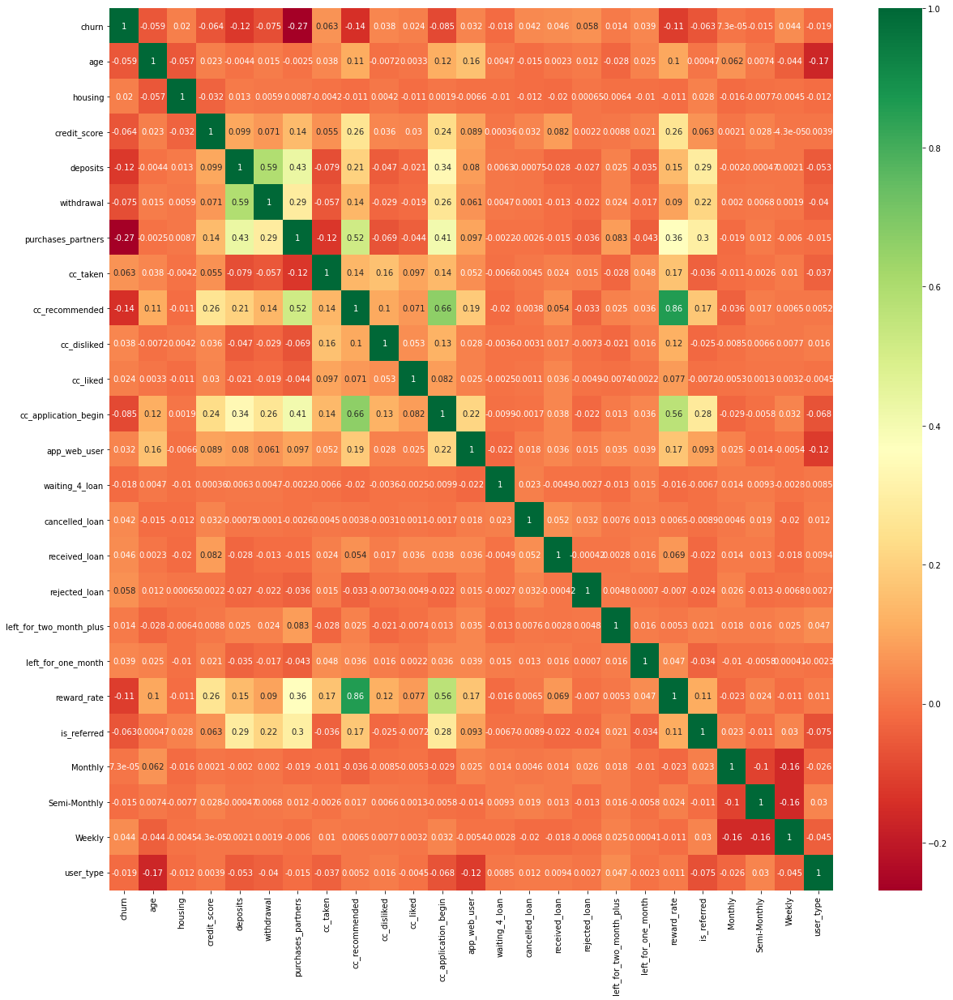

In [246]:
import seaborn as sns

# Correations of each features in dataset.
corrmat = churn.corr()
top_corr_features = corrmat.index

plt.figure(figsize=(20,20))
sns.heatmap(churn[top_corr_features].corr(), annot=True, cmap="RdYlGn")

**Observations**
- As we could see that all our 6 largest important feature is Negatively correlated with churn.
    * churn - age                   -     ( -0.059 )
    * churn - credit_score          - ( -0.064 )
    * churn - purchase parttners    - ( -0.27 )   - **` Negative correlated`**
    * churn - cc_recommended        - ( -0.14 )   - **` Negative correlated`**
    * churn - cc_application_begin  - ( -0.085 )
    * churn - reward rate           - ( -0.11 )   - **` Negative correlated`**

In [247]:
# in order to remove the correlated
# Find and remove correlated features:
def correlation(churn, threshold):
    col_corr = set()                    # set all the names of correlated columns
    corr_matrix = churn.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j]) > threshold:  
                colname = corr_matrix.columns[i]
                col_corr.add(colname)
    return col_corr

In [248]:
threshold = 0.5
correlation(churn.iloc[:,1:], threshold)

{'cc_application_begin', 'cc_recommended', 'reward_rate', 'withdrawal'}

In [249]:
threshold = 0.8
correlation(churn.iloc[:,1:], threshold)

{'reward_rate'}

**observation**
- we get four vaiable are higly correlated when threshold is set for 50%
- similarly one variable is higly correlated when threshold is set for 80%

#### Findinding important feature through another Information Gained:

In [250]:
from sklearn.feature_selection import mutual_info_classif

In [251]:
mutual_info = mutual_info_classif(x,y)

In [252]:
mutual_data = pd.Series(mutual_info, index=x.columns)
mutual_data.sort_values(ascending=False).reset_index()

,index,0
0,purchases_partners,0.046986
1,reward_rate,0.036409
2,cc_recommended,0.016573
3,deposits,0.008579
4,age,0.005774
5,is_referred,0.005012
6,waiting_4_loan,0.002843
7,user_type,0.002347
8,cc_application_begin,0.001967
9,cc_taken,0.001645


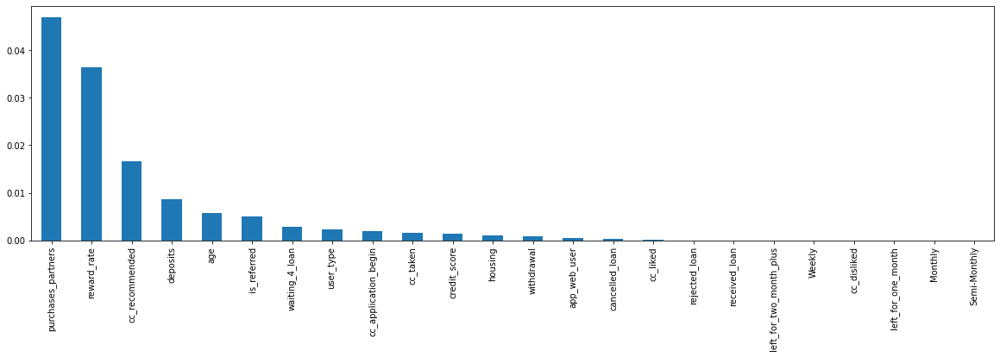

In [253]:
# lets plot the ordered mutual info values perf igure
mutual_data.sort_values(ascending=False).plot.bar(figsize=(20,5))

**Observation**
- There are 4 variable zero where we get those are not correlated these are independent variabbles.
- Other than that all variables are dependent to churn somewhere.


----------------

In [272]:
churn.drop(columns = ['reward_rate'],inplace = True)

In [273]:
#sklearn modules for Model Selection--------------------------------------

from sklearn import svm, tree, linear_model, neighbors
from sklearn import naive_bayes, ensemble, discriminant_analysis, gaussian_process
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


#sklearn modules for Model Evaluation & Improvement---------------------------
    
from sklearn.metrics import confusion_matrix, accuracy_score 
from sklearn.metrics import f1_score, precision_score, recall_score, fbeta_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold

from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics

from sklearn.metrics import classification_report, precision_recall_curve
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import make_scorer, recall_score, log_loss
from sklearn.metrics import average_precision_score
from sklearn.metrics import cohen_kappa_score

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

## Model Building
- we will develop Logistic Regression, Random Forest, SVM, Ada Boost, Navies Bayes, Decision Tree and KNN.

## Logistic Regression

In [274]:
# We will use the above dataframe where we created our variables
y = churn['churn'].values
x = churn.drop(columns = ['churn'])

# Scaling all the variables to a range of 0 to 1
#from sklearn.preprocessing import MinMaxScaler
#features = X.columns.values
#scaler = MinMaxScaler(feature_range = (0,1))
#scaler.fit(X)

#X = pd.DataFrame(scaler.transform(X))
#X.columns = features

# create Train & Test Data
    
y = churn['churn'].values
x = churn.drop(columns = ['churn'])
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 100)    

In [275]:
from sklearn.preprocessing import StandardScaler 

sc_X = StandardScaler()
X_train2 = pd.DataFrame(sc_X.fit_transform(x_train))
X_train2.columns = x_train.columns.values
X_train2.index = x_train.index.values
x_train = X_train2

X_test2 = pd.DataFrame(sc_X.transform(x_test))
X_test2.columns = x_test.columns.values
X_test2.index = x_test.index.values
x_test = X_test2

In [276]:
y = churn['churn'].values
x = churn.drop(columns = ['churn'])

sc_X = StandardScaler()

x = pd.DataFrame(sc_X.fit_transform(x),columns = x.columns)
x.head()

,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_web_user,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,is_referred,Monthly,Semi-Monthly,Weekly,user_type
0,0.732260,0.441266,-0.919912,-0.636981,-0.375879,-0.773996,-0.181751,-0.969224,-0.100031,-0.067318,-0.839273,0.943981,-0.03645,-0.133345,-0.133688,-0.072739,2.220997,-0.125937,-0.628825,-0.317035,-0.319479,-0.495296,-1.279590
1,-0.345458,0.441266,-0.452373,-0.636981,-0.375879,-0.732598,-0.181751,0.288637,-0.100031,-0.067318,-0.002797,0.943981,-0.03645,-0.133345,-0.133688,-0.072739,-0.450248,-0.125937,1.590268,-0.317035,-0.319479,2.018994,-1.279590
2,0.492767,0.441266,0.756779,1.569905,2.660429,2.786223,-0.181751,2.765051,-0.100031,-0.067318,0.666384,-1.059343,-0.03645,-0.133345,-0.133688,-0.072739,2.220997,-0.125937,-0.628825,-0.317035,3.130099,-0.495296,0.781501
3,-0.584951,0.441266,0.853511,1.569905,2.660429,0.799124,-0.181751,0.000377,-0.100031,-0.067318,2.673926,-1.059343,-0.03645,-0.133345,-0.133688,-0.072739,-0.450248,-0.125937,1.590268,-0.317035,-0.319479,-0.495296,0.781501
4,-0.465204,0.441266,-1.322962,-0.636981,-0.375879,-0.691200,-0.181751,-0.969224,-0.100031,-0.067318,-0.839273,0.943981,-0.03645,-0.133345,-0.133688,-0.072739,2.220997,-0.125937,-0.628825,-0.317035,-0.319479,-0.495296,0.781501


In [277]:
from sklearn.linear_model import LogisticRegression

cols = list(x.columns)
model = LogisticRegression()
#Initializing RFE model
rfe = RFE(model, 15)             
#Transforming data using RFE
X_rfe = rfe.fit_transform(x,y)  
#Fitting the data to model
model.fit(X_rfe,y)              
temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index

imp_feat_logreg = list(selected_features_rfe)
print(selected_features_rfe)

Index(['age', 'housing', 'credit_score', 'purchases_partners', 'cc_taken',
       'cc_recommended', 'cc_application_begin', 'app_web_user',
       'cancelled_loan', 'received_loan', 'rejected_loan',
       'left_for_two_month_plus', 'left_for_one_month', 'Weekly', 'user_type'],
      dtype='object')


In [278]:
# Running logistic regression model
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 100)  


x_train = x_train[imp_feat_logreg]
x_test = x_test[imp_feat_logreg]
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model = model.fit(x_train, y_train)

In [279]:
from sklearn import metrics
y_pred = model.predict(x_test)

# Print the prediction accuracy
print(metrics.accuracy_score(y_test, y_pred))
metrics.r2_score(y_test, y_pred)

0.6388028895768834


-0.4639989639989639

In [280]:
acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec = recall_score(y_test, y_pred )
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)
r2 = metrics.r2_score(y_test, y_pred)

results = pd.DataFrame([['Logistic Regression (Top 15 Features)', acc, prec, rec, f1, f2,r2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score','R2 Score'])


In [281]:
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.57722,-0.463999


In [282]:
models={}
models.update({'Logistic Regression': recall_score(y_test, y_pred )})

## Decision Tree

In [283]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(random_state = 1)
rfe = RFE(model, 15)             
#Transforming data using RFE
X_rfe = rfe.fit_transform(x,y)  
#Fitting the data to model
model.fit(X_rfe,y)              
temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index

imp_feat_dt = list(selected_features_rfe)
print(selected_features_rfe)

Index(['age', 'housing', 'credit_score', 'deposits', 'withdrawal',
       'purchases_partners', 'cc_recommended', 'cc_application_begin',
       'app_web_user', 'left_for_two_month_plus', 'is_referred', 'Monthly',
       'Semi-Monthly', 'Weekly', 'user_type'],
      dtype='object')


In [284]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 100)  

x_train = x_train[imp_feat_dt]
x_test = x_test[imp_feat_dt]

dt_model = DecisionTreeClassifier(random_state = 1)
dt_model.fit(x_train,y_train)
y_pred = dt_model.predict(x_test)
print('Accuracy Score for Base Model :',round(accuracy_score(y_test,y_pred),2))

Accuracy Score for Base Model : 0.59


In [286]:
acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_dec = recall_score(y_test, y_pred )
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)
r2 = metrics.r2_score(y_test, y_pred)

model_results = pd.DataFrame([['Decision Tree (Top 15 Features)', acc, prec, rec, f1, f2,r2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score','R2 Score'])
results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252


In [288]:
models.update({'Decision Tree': rec_dec})

## Decision Tree Hyperparameter Tuning

In [289]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x[imp_feat_dt], y, test_size = 0.3, random_state = 100) 


from sklearn.model_selection import GridSearchCV
tuned_parameters = ({'criterion':['entropy','gini'],'max_depth' : np.arange(2,20), 'max_features': np.arange(10,20),
                     'min_samples_split' : np.arange(100,500,100)})
dt_model_grid = DecisionTreeClassifier(random_state = 10)
dt_grid = GridSearchCV(estimator = dt_model_grid,param_grid = tuned_parameters,cv = 5,n_jobs= -1)
dt_grid.fit(x_train,y_train)

dt_tuned_model = DecisionTreeClassifier(criterion = dt_grid.best_params_['criterion'],
                                                  max_depth =dt_grid.best_params_['max_depth'],
                                                  min_samples_split = dt_grid.best_params_['min_samples_split'],
                                                  max_features= dt_grid.best_params_['max_features'],random_state = 50)


In [290]:
dt_tuned_model.fit(x_train,y_train)
y_pred_tuned = dt_tuned_model.predict(x_test)
print('Accuracy Score for Tuned Model :',round(accuracy_score(y_test,y_pred_tuned),2))

Accuracy Score for Tuned Model : 0.65


In [291]:
acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_hyp_dec = recall_score(y_test, y_pred )
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)
r2 = metrics.r2_score(y_test, y_pred)

model_results = pd.DataFrame([['Tuned Decision Tree (Top 15 Features)', acc, prec, rec, f1, f2,r2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score','R2 Score'])
results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252


In [292]:
models.update({'Decision tree after Tuning' : rec_hyp_dec})

## Random Forest

In [293]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators = 1000, criterion = 'entropy', random_state = 0)

rfe = RFE(model, 15)             
#Transforming data using RFE
X_rfe = rfe.fit_transform(x,y)  
#Fitting the data to model
model.fit(X_rfe,y)              
temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index

imp_feat_random_forest = list(selected_features_rfe)
print(selected_features_rfe)

Index(['age', 'housing', 'credit_score', 'deposits', 'withdrawal',
       'purchases_partners', 'cc_recommended', 'cc_application_begin',
       'app_web_user', 'left_for_two_month_plus', 'is_referred', 'Monthly',
       'Semi-Monthly', 'Weekly', 'user_type'],
      dtype='object')


In [294]:
from sklearn.ensemble import RandomForestClassifier
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 101)

x_train = x_train[imp_feat_random_forest]
x_test = x_test[imp_feat_random_forest]

classifier_rf = RandomForestClassifier(n_estimators = 1000, criterion = 'entropy', random_state = 0)
classifier_rf.fit(x_train, y_train)



# Predicting the Test set results 
y_pred = classifier_rf.predict(x_test)

#Evaluate results

from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score
acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_rf = recall_score(y_test, y_pred )
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)
r2 = metrics.r2_score(y_test, y_pred)

model_results = pd.DataFrame([['Random Forest(Top 15 Features)', acc, prec, rec, f1, f2,r2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score','R2 Score'])
results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772


In [295]:
models.update({'Random Forest': rec_rf})

## Hyper Parameter Tuning in Random Forest

In [296]:
n_estimators = [100, 300, 500, 800, 1200]
max_depth = [5, 8, 15, 25, 30]
min_samples_split = [2, 5, 10, 15, 100]
min_samples_leaf = [1, 2, 5, 10] 

forest = RandomForestClassifier(random_state = 1, n_estimators = 10, min_samples_split = 1)

hyperF = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

gridF = GridSearchCV(forest, hyperF, cv = 3, verbose = 1, 
                      n_jobs = -1)
bestF = gridF.fit(x_train, y_train)

Fitting 3 folds for each of 500 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 46.7min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 83.8min
[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed: 104.2min finished


In [297]:
classifier_rf = RandomForestClassifier(n_estimators = bestF.best_params_['n_estimators'],
                                       max_depth = bestF.best_params_['max_depth'],
                                       min_samples_split = bestF.best_params_['min_samples_split'],  
                                       min_samples_leaf = bestF.best_params_['min_samples_leaf'], 
                                       criterion = 'entropy', random_state = 0)
classifier_rf.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=800,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [298]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

y_pred = classifier_rf.predict(x_test)

acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred)
rec_rft = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)
r2 = metrics.r2_score(y_test, y_pred)

model_results = pd.DataFrame([['Random Forest Tuned (Top 15 Features)', acc, prec, rec, f1, f2,r2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score','R2 Score'])
results = results.append(model_results, ignore_index = True)


In [299]:
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469


In [300]:
models.update({'Random Forest after tuning': rec_rft})

## SVM

In [301]:
model = SVC(kernel = 'linear', random_state = 0)

rfe = RFE(model, 15)             
#Transforming data using RFE
X_rfe = rfe.fit_transform(x,y)  
#Fitting the data to model
model.fit(X_rfe,y)              
temp = pd.Series(rfe.support_,index = cols)


selected_features_rfe = temp[temp==True].index
imp_feat_svm = list(selected_features_rfe)
print(selected_features_rfe)

Index(['age', 'housing', 'credit_score', 'deposits', 'purchases_partners',
       'cc_taken', 'cc_application_begin', 'app_web_user', 'cancelled_loan',
       'received_loan', 'rejected_loan', 'left_for_two_month_plus',
       'left_for_one_month', 'Weekly', 'user_type'],
      dtype='object')


In [303]:
from sklearn.svm import SVC

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 101)

x_train = x_train[selected_features_rfe]
x_test = x_test[selected_features_rfe]

# Fitting SVM (SVC class) to the Training set:

classifier = SVC(kernel = 'linear', random_state = 0)
classifier.fit(x_train, y_train)

# Predicting the Test set results 
y_pred = classifier.predict(x_test)

#Evaluate results
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_svm = recall_score(y_test, y_pred )
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)
r2 = metrics.r2_score(y_test, y_pred)

model_results = pd.DataFrame([['SVM(Top 15 Features)', acc, prec, rec, f1, f2,r2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score','R2 Score'])
results = results.append(model_results, ignore_index = True)

In [304]:
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620


In [305]:
models.update({'SVM': rec_svm})

## KNN

In [306]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

x = churn.drop('churn',1)
y = churn['churn']

sc = StandardScaler()
num_cols = x.columns
x_std = sc.fit_transform(x)

x = pd.DataFrame(x_std,columns = num_cols)
x.head()

,age,housing,credit_score,deposits,withdrawal,purchases_partners,cc_taken,cc_recommended,cc_disliked,cc_liked,cc_application_begin,app_web_user,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,is_referred,Monthly,Semi-Monthly,Weekly,user_type
0,0.732260,0.441266,-0.919912,-0.636981,-0.375879,-0.773996,-0.181751,-0.969224,-0.100031,-0.067318,-0.839273,0.943981,-0.03645,-0.133345,-0.133688,-0.072739,2.220997,-0.125937,-0.628825,-0.317035,-0.319479,-0.495296,-1.279590
1,-0.345458,0.441266,-0.452373,-0.636981,-0.375879,-0.732598,-0.181751,0.288637,-0.100031,-0.067318,-0.002797,0.943981,-0.03645,-0.133345,-0.133688,-0.072739,-0.450248,-0.125937,1.590268,-0.317035,-0.319479,2.018994,-1.279590
2,0.492767,0.441266,0.756779,1.569905,2.660429,2.786223,-0.181751,2.765051,-0.100031,-0.067318,0.666384,-1.059343,-0.03645,-0.133345,-0.133688,-0.072739,2.220997,-0.125937,-0.628825,-0.317035,3.130099,-0.495296,0.781501
3,-0.584951,0.441266,0.853511,1.569905,2.660429,0.799124,-0.181751,0.000377,-0.100031,-0.067318,2.673926,-1.059343,-0.03645,-0.133345,-0.133688,-0.072739,-0.450248,-0.125937,1.590268,-0.317035,-0.319479,-0.495296,0.781501
4,-0.465204,0.441266,-1.322962,-0.636981,-0.375879,-0.691200,-0.181751,-0.969224,-0.100031,-0.067318,-0.839273,0.943981,-0.03645,-0.133345,-0.133688,-0.072739,2.220997,-0.125937,-0.628825,-0.317035,-0.319479,-0.495296,0.781501


In [307]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state = 1)

knn = KNeighborsClassifier()
knn.fit(x_train,y_train)
y_pred = knn.predict(x_test)
print('Accuracy Score :',round(accuracy_score(y_test,y_pred),2))
print(classification_report(y_test,y_pred))

Accuracy Score : 0.61
              precision    recall  f1-score   support

           0       0.64      0.68      0.65      2480
           1       0.57      0.53      0.55      2042

    accuracy                           0.61      4522
   macro avg       0.60      0.60      0.60      4522
weighted avg       0.61      0.61      0.61      4522



In [308]:
#Evaluate results for Decision Tree
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_Knn = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)

model_results = pd.DataFrame([['Knn', acc, prec, rec, f1, f2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620
7,Knn,0.609686,0.573319,0.535465,0.551005,0.538431,NaN


In [309]:
models.update({'Knn': rec_Knn})

## KNN tuning

In [310]:
from sklearn.model_selection import GridSearchCV
tuned_parameters = {'n_neighbors' : np.arange(1, 25),
                   'metric' : ['euclidean','manhattan','Chebyshev','minkowski']}
model = KNeighborsClassifier()
KNN_grid = GridSearchCV(estimator = model,
                  param_grid = tuned_parameters,
                  cv = 3,n_jobs = -1)
KNN_grid.fit(x_train,y_train)
print('Best Parameters for KNN Classifier is :',KNN_grid.best_params_,'\n')

Best Parameters for KNN Classifier is : {'metric': 'manhattan', 'n_neighbors': 23} 



In [311]:
knn_tuned_model= KNeighborsClassifier(n_neighbors=KNN_grid.best_params_['n_neighbors'],
                                     metric = KNN_grid.best_params_['metric'])
knn_tuned_model.fit(x_train,y_train)
y_pred_tuned = knn_tuned_model.predict(x_test)
print('Accuracy Score for KNN tuned Model is :',round(accuracy_score(y_test,y_pred_tuned),2))
print(classification_report(y_test,y_pred_tuned))

Accuracy Score for KNN tuned Model is : 0.63
              precision    recall  f1-score   support

           0       0.65      0.71      0.68      2480
           1       0.60      0.53      0.57      2042

    accuracy                           0.63      4522
   macro avg       0.63      0.62      0.62      4522
weighted avg       0.63      0.63      0.63      4522



In [312]:
#Evaluate results for Decision Tree
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_Knnt = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)

model_results = pd.DataFrame([['Knn Tuning', acc, prec, rec, f1, f2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620
7,Knn,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
8,Knn Tuning,0.609686,0.573319,0.535465,0.551005,0.538431,NaN


In [313]:
models.update({'Knn Tuning': rec_Knnt})

## Navie bayes

In [314]:
# training the model on training set
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(x_train, y_train)
  
# making predictions on the testing set
y_pred = gnb.predict(x_test)
  
# comparing actual response values (y_test) with predicted response values (y_pred)
print("Gaussian Naive Bayes model accuracy(in %):", accuracy_score(y_test, y_pred)*100)
print(classification_report(y_test,y_pred))

Gaussian Naive Bayes model accuracy(in %): 58.02742149491375
              precision    recall  f1-score   support

           0       0.57      0.94      0.71      2480
           1       0.67      0.14      0.23      2042

    accuracy                           0.58      4522
   macro avg       0.62      0.54      0.47      4522
weighted avg       0.61      0.58      0.50      4522



In [315]:
#Evaluate results for Gaussian Naive Bayes
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_NB = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)

model_results = pd.DataFrame([['Naive Bayes', acc, prec, rec, f1, f2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620
7,Knn,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
8,Knn Tuning,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
9,Naive Bayes,0.580274,0.666667,0.535465,0.232821,0.167442,NaN


In [316]:
models.update({'Navie Bayes': rec_NB})

## AdaBoosting

In [317]:
from sklearn.ensemble import AdaBoostClassifier
# instantiate the 'AdaBoostClassifier'
# n_estimators: number of estimators at which boosting is terminated
# pass the 'random_state' to obtain the same results for each code implementation
dt_tuned_model = DecisionTreeClassifier(criterion = dt_grid.best_params_['criterion'],
                                                  max_depth =dt_grid.best_params_['max_depth'],
                                                  min_samples_split = dt_grid.best_params_['min_samples_split'],
                                                  max_features= dt_grid.best_params_['max_features'],random_state = 50)
ada_model = AdaBoostClassifier(base_estimator =dt_tuned_model, n_estimators = 40, random_state = 10)

# fit the model using fit() on train data
ada_model.fit(x_train, y_train)

y_pred = ada_model.predict(x_test)
# comparing actual response values (y_test) with predicted response values (y_pred)
print("Adaboost model accuracy(in %):", accuracy_score(y_test, y_pred)*100)

Adaboost model accuracy(in %): 64.97125165855816


In [318]:
#Evaluate results for Decision Tree
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_Ab = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)

model_results = pd.DataFrame([['Ada Boost', acc, prec, rec, f1, f2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620
7,Knn,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
8,Knn Tuning,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
9,Naive Bayes,0.580274,0.666667,0.535465,0.232821,0.167442,NaN


In [319]:
models.update({'Ada Boosting': rec_Ab})

## Ada Boosting Tuning

In [320]:
dt_tuned_model = DecisionTreeClassifier(criterion = dt_grid.best_params_['criterion'],
                                                  max_depth =dt_grid.best_params_['max_depth'],
                                                  min_samples_split = dt_grid.best_params_['min_samples_split'],
                                                  max_features= dt_grid.best_params_['max_features'],random_state = 50)
ada_model = AdaBoostClassifier(base_estimator =dt_tuned_model,random_state = 10)

search_grid={'n_estimators':[50,100,200],'learning_rate':[.001,0.01,.1]}

ada_tuned_model=GridSearchCV(estimator=ada_model,param_grid=search_grid,scoring='accuracy',n_jobs=1,cv=5)
ada_tuned_model.fit(x_train,y_train)
ada_tuned_model.best_params_

{'learning_rate': 0.1, 'n_estimators': 50}

In [321]:
ada_model_tuned = AdaBoostClassifier(base_estimator =dt_tuned_model,learning_rate=ada_tuned_model.best_params_['learning_rate'],n_estimators=ada_tuned_model.best_params_['n_estimators'],random_state = 10)

# fit the model using fit() on train data
ada_model_tuned = ada_model_tuned.fit(x_train,y_train)

y_pred = ada_model_tuned.predict(x_test)

# comparing actual response values (y_test) with predicted response values (y_pred)
print("Tuned Adaboost model accuracy(in %):", accuracy_score(y_test, y_pred)*100)

Tuned Adaboost model accuracy(in %): 67.60283060592658


In [322]:
#Evaluate results for Decision Tree
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score

acc = accuracy_score(y_test, y_pred )
prec = precision_score(y_test, y_pred )
rec_ABT = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred )
f2 = fbeta_score(y_test, y_pred, beta=2.0)

model_results = pd.DataFrame([['Ada Boost Tuning', acc, prec, rec, f1, f2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

results = results.append(model_results, ignore_index = True)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620
7,Knn,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
8,Knn Tuning,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
9,Naive Bayes,0.580274,0.666667,0.535465,0.232821,0.167442,NaN


In [323]:
models.update({'Ada Boosting Tuning': rec_ABT})

======================================================================================================================

## Conclusion

In [324]:
results.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
11,Ada Boost Tuning,0.676028,0.670408,0.535465,0.607764,0.575499,NaN
10,Ada Boost,0.649713,0.630114,0.535465,0.583377,0.558521,NaN
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
7,Knn,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
8,Knn Tuning,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252


In [325]:
results.sort_values(by='Recall', ascending=False)

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score,R2 Score
0,Logistic Regression (Top 15 Features),0.638803,0.595774,0.572761,0.584041,0.577220,-0.463999
1,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
2,Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
3,Tuned Decision Tree (Top 15 Features),0.593838,0.541779,0.535465,0.538603,0.536716,-0.646252
4,Random Forest(Top 15 Features),0.679345,0.658581,0.535465,0.599669,0.569123,-0.303772
5,Random Forest Tuned (Top 15 Features),0.678682,0.652403,0.535465,0.605056,0.579808,-0.306469
6,SVM(Top 15 Features),0.639540,0.583293,0.535465,0.595734,0.603457,-0.465620
7,Knn,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
8,Knn Tuning,0.609686,0.573319,0.535465,0.551005,0.538431,NaN
9,Naive Bayes,0.580274,0.666667,0.535465,0.232821,0.167442,NaN


## Overall fit of the model

In [326]:
model=pd.DataFrame(models.keys(),models.values()).reset_index()
model.columns=['Recall score','Model_Name']
model

,Recall score,Model_Name
0,0.572761,Logistic Regression
1,0.535465,Decision Tree
2,0.535465,Decision tree after Tuning
3,0.550431,Random Forest
4,0.564116,Random Forest after tuning
5,0.608718,SVM
6,0.530362,Knn
7,0.530362,Knn Tuning
8,0.141038,Navie Bayes
9,0.543095,Ada Boosting


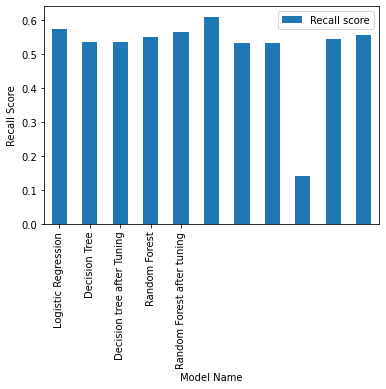

In [327]:
model.plot(kind='bar')
plt.xlabel('Model Name')
plt.ylabel('Recall Score')
plt.xticks([0,1,2,3,4],model['Model_Name'])
plt.show()

## Business Intrepretation

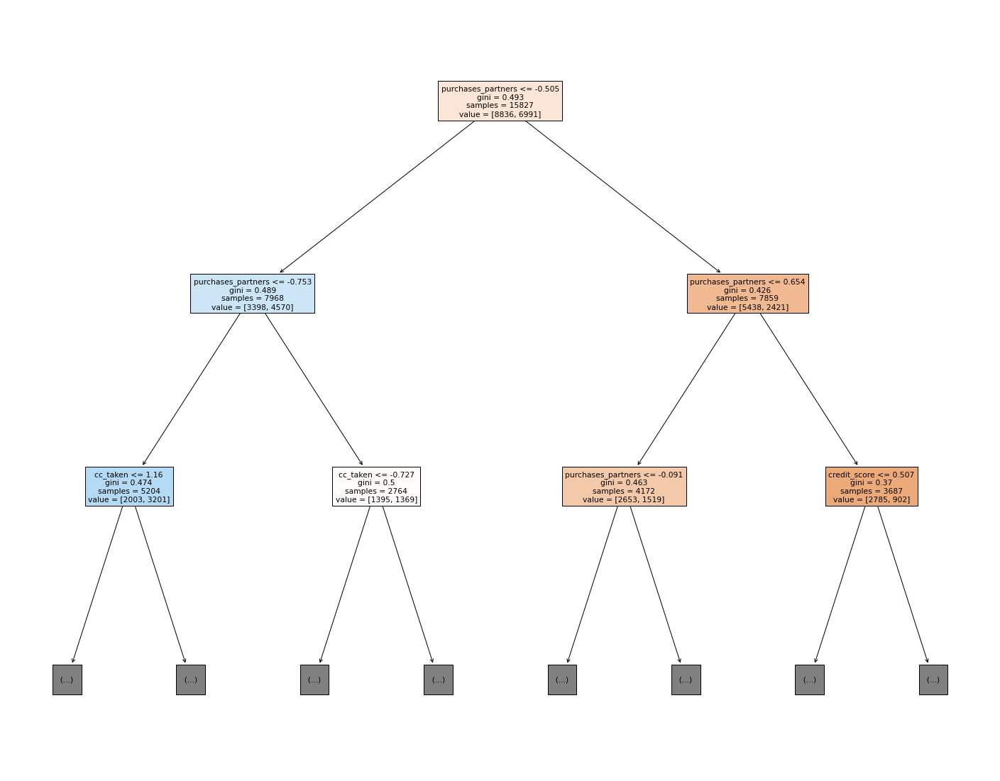

In [328]:
from sklearn import tree

fig=plt.figure(figsize=(25,20))
tree = tree.plot_tree(dt_model,max_depth=2,feature_names=x.columns,filled=True)